## This Notebook contains testing of SEUnet architecture for machine onion defect model

In [1]:
import numpy as np
import cv2
import os
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Input,Conv2D,BatchNormalization,UpSampling2D,concatenate
import time
h,w = 224,224

2024-06-17 13:27:52.968389: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-17 13:27:53.501502: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-17 13:27:54.416530: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/agrograde/anaconda3/envs/tf/lib/python3.9/site-packages/cv2/../../lib64::/home/agrograde/anaconda3/envs/tf/lib/
2024-06-17 13:27:54.416619: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Co

In [2]:
#build model

from keras.layers import *
from keras.models import *
def SEModule(input, ratio, out_dim):
    # bs, c, h, w
    x = GlobalAveragePooling2D()(input)
    excitation = Dense(units=out_dim // ratio)(x)
    excitation = Activation('relu')(excitation)
    excitation = Dense(units=out_dim)(excitation)
    excitation = Activation('sigmoid')(excitation)
    excitation = Reshape((1, 1, out_dim))(excitation)
    scale = multiply([input, excitation])
    return scale



def SEUnet(nClasses, input_height=224, input_width=224):
    inputs = Input(shape=(input_height, input_width, 3))
    conv1 = Conv2D(16,3,activation='relu',padding='same',kernel_initializer='he_normal')(inputs)
    conv1 = BatchNormalization()(conv1)

    conv1 = Conv2D(16,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv1)
    conv1 = BatchNormalization()(conv1)

    # se
    conv1 = SEModule(conv1, 4, 16)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(32,3,activation='relu',padding='same',kernel_initializer='he_normal')(pool1)
    conv2 = BatchNormalization()(conv2)

    conv2 = Conv2D(32,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv2)
    conv2 = BatchNormalization()(conv2)

    # se
    conv2 = SEModule(conv2, 8, 32)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(64,3,activation='relu',padding='same',kernel_initializer='he_normal')(pool2)
    conv3 = BatchNormalization()(conv3)

    conv3 = Conv2D(64,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv3)
    conv3 = BatchNormalization()(conv3)

    # se
    conv3 = SEModule(conv3, 8, 64)

    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(128,3,activation='relu',padding='same',kernel_initializer='he_normal')(pool3)
    conv4 = BatchNormalization()(conv4)

    conv4 = Conv2D(128,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv4)
    conv4 = BatchNormalization()(conv4)

    # se
    conv4 = SEModule(conv4, 16, 128)

    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(256,3,activation='relu',padding='same',kernel_initializer='he_normal')(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(256,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv5)
    conv5 = BatchNormalization()(conv5)

    # se
    conv5 = SEModule(conv5, 16, 256)

    up6 = Conv2D(128,2,activation='relu',padding='same',kernel_initializer='he_normal')(UpSampling2D(size=(2,2))(conv5))
    up6 = BatchNormalization()(up6)

    merge6 = concatenate([conv4, up6], axis=3)
    conv6 = Conv2D(128,3,activation='relu',padding='same',kernel_initializer='he_normal')(merge6)
    conv6 = BatchNormalization()(conv6)

    conv6 = Conv2D(128,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv6)
    conv6 = BatchNormalization()(conv6)

    # se
    conv6 = SEModule(conv6, 16, 128)

    up7 = Conv2D(64,2,activation='relu',padding='same',kernel_initializer='he_normal')(UpSampling2D(size=(2,2))(conv6))
    up7 = BatchNormalization()(up7)

    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(64,3,activation='relu',padding='same',kernel_initializer='he_normal')(merge7)
    conv7 = BatchNormalization()(conv7)

    conv7 = Conv2D(64,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv7)
    conv7 = BatchNormalization()(conv7)

    # se
    conv7 = SEModule(conv7, 8, 64)

    up8 = Conv2D(32,2,activation='relu',padding='same',kernel_initializer='he_normal')(UpSampling2D(size=(2,2))(conv7))
    up8 = BatchNormalization()(up8)

    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(32,3,activation='relu',padding='same',kernel_initializer='he_normal')(merge8)
    conv8 = BatchNormalization()(conv8)

    conv8 = Conv2D(32,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv8)
    conv8 = BatchNormalization()(conv8)

    # se
    conv8 = SEModule(conv8, 4, 32)

    up9 = Conv2D(16,2,activation='relu',padding='same',kernel_initializer='he_normal')(UpSampling2D(size=(2,2))(conv8))
    up9 = BatchNormalization()(up9)

    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(16,3,activation='relu',padding='same',kernel_initializer='he_normal')(merge9)
    conv9 = BatchNormalization()(conv9)

    conv9 = Conv2D(16,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv9)
    conv9 = BatchNormalization()(conv9)

    # se
    conv9 = SEModule(conv9, 2, 16)

    conv10 = Conv2D(nClasses, (3, 3), padding='same')(conv9)
    conv10 = BatchNormalization()(conv10)

    outputHeight = Model(inputs, conv10).output_shape[1]
    outputWidth = Model(inputs, conv10).output_shape[2]

    out = (Reshape((outputHeight * outputWidth, nClasses)))(conv10)
    out = Activation('softmax')(out)

    model = Model(inputs, out)
    model.outputHeight = outputHeight
    model.outputWidth = outputWidth

    return model

model1 = SEUnet(nClasses=3)
model1.summary()

x = model1.get_layer(index=-3).output



out0 = Conv2D(2, (1, 1), activation='softmax',name='peeled')(x)
out1 = Conv2D(2, (1, 1), activation='softmax',name='Black_smut')(x)
out2 = Conv2D(2, (1, 1), activation='softmax',name='background')(x)

# out4 = Conv2D(2, (1, 1), activation='softmax',name='wrinkles')(x)
# out5 = Conv2D(2, (1, 1), activation='softmax',name='background')(x)
# out6 = 

model_new = Model(inputs = model1.input,outputs = [out0,out1,out2])
model_new.summary()

2024-06-17 13:27:55.877763: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-06-17 13:27:55.924425: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-06-17 13:27:55.924697: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-06-17 13:27:55.925802: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 224, 224, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                           

 multiply_2 (Multiply)          (None, 56, 56, 64)   0           ['batch_normalization_5[0][0]',  
                                                                  'reshape_2[0][0]']              
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 28, 28, 64)  0           ['multiply_2[0][0]']             
                                                                                                  
 conv2d_6 (Conv2D)              (None, 28, 28, 128)  73856       ['max_pooling2d_2[0][0]']        
                                                                                                  
 batch_normalization_6 (BatchNo  (None, 28, 28, 128)  512        ['conv2d_6[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 conv2d_7 

                                                                                                  
 dense_10 (Dense)               (None, 8)            1032        ['global_average_pooling2d_5[0][0
                                                                 ]']                              
                                                                                                  
 activation_10 (Activation)     (None, 8)            0           ['dense_10[0][0]']               
                                                                                                  
 dense_11 (Dense)               (None, 128)          1152        ['activation_10[0][0]']          
                                                                                                  
 activation_11 (Activation)     (None, 128)          0           ['dense_11[0][0]']               
                                                                                                  
 reshape_5

                                                                                                  
 dense_15 (Dense)               (None, 32)           288         ['activation_14[0][0]']          
                                                                                                  
 activation_15 (Activation)     (None, 32)           0           ['dense_15[0][0]']               
                                                                                                  
 reshape_7 (Reshape)            (None, 1, 1, 32)     0           ['activation_15[0][0]']          
                                                                                                  
 multiply_7 (Multiply)          (None, 112, 112, 32  0           ['batch_normalization_18[0][0]', 
                                )                                 'reshape_7[0][0]']              
                                                                                                  
 up_sampli

In [9]:
# model_new.load_weights('/home/agrograde/Desktop/Seg_code_2023_potato/sam/Seg_model_potato/potato_seg_08_april_2023_2769_cpu_300_epochs_4_classes_t2.h5')

# model_new.load_weights('/home/agrograde/Desktop/Seg_code_2023_potato/sam/Seg_model_potato/potato_seg_08_april_2023_2769_cpu_300_epochs_4_classes_t2_08_04_2023_t2.h5')

# model_new.load_weights('/home/agrograde/Desktop/Seg_code_2023_potato/sam/Seg_model_potato/potato_seg_08_april_400_4_52.h5')
model_new.load_weights(r"/home/agrograde/Desktop/12th_june/old_summer_onion/test/model_file/model_ckpt.h5")

In [10]:
# # folder=['holes":1.0,"potato": 1.0,"rotten": 1.0,"cuts"]
def bbox(img, mask, flag):
    visuals = img.copy()
        
    if flag=='pl':
        color=(252,51,255)
        
    if flag=='bs':
        color=(60,59,43)

    if flag=="bg":
        color = (45,255,11)

    else:
        color = (230,126,34)
     
    

        
    contours = cv2.findContours(mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)[0]
    visuals = cv2.drawContours(img.copy(), contours, -1, color,1)
    return visuals

In [11]:
def getPercentArea(full_mask, region_mask):

    full_mask = cv2.resize(full_mask.astype(float), (224,224))
    total_area,region_area = np.sum(full_mask),np.sum(region_mask)
    

    area_percentage = (region_area/total_area)*100
    return area_percentage

global final_mask
def getCombinedMask(img, defect_masks):
    final_mask = np.zeros_like(img)
    
    pl_mask,bs_mask,bg_mask = defect_masks

#     print(ho_mask.shape,po_mask.shape,ro_mask.shape,cu_mask.shape)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if pl_mask[i,j]>0:
                final_mask[i,j,:]=[252,51,255]
            elif bs_mask[i,j]>0:
                final_mask[i,j,:]=[60,59,43]
            elif bg_mask[i,j]>0:
                 final_mask[i,j,:]=[45,255,11]

           
            else:
                final_mask[i,j,:]=[45,255,11]
    
    return final_mask

def dice(im1, im2):
    im1 = cv2.resize(im1, (288,288))
    im2 = cv2.resize(im2, (288,288))
    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / (im1.sum() + im2.sum())

In [12]:
import glob
import skimage
import matplotlib.pyplot as plt
import keras.backend as K
import time
global masks
masks = []
def calaculate(masks_lst):
    defect_candidates = []
    
    
    def_seg = np.zeros(shape=(224,224,len(masks_lst)),dtype=np.uint8)

    for i in range(len(masks_lst)): #0 to 3

        mask = np.argmax(masks_lst[i], axis=3)
        mask = mask.reshape(224,224)
        mask = 255*mask.astype(np.uint8)
        mask_1 = cv2.resize(mask, (224,224))
        masks.append(mask_1)

        def_seg[:,:,i] = mask_1
        extent = np.sum(mask_1)

        defect_candidates.append(extent)

        
        defects = np.squeeze(np.array(defect_candidates[:])/(sum(defect_candidates)+1))*100

        
def getPrediction(img_path):
    pl_lst = []
    pl_img = []
    
    for image in os.listdir(img_path):
        print(f"name of the image {image}")
        pl_img.append(image)
        
        if image.endswith('.jpg'):
            img = cv2.imread(os.path.join(img_path,image))
            #print(f"name of the image {img}")
#             mask = cv2.imread(os.path.join(img_path+'blacksmut_masks',image))
            im = cv2.resize(img,(h,w))

    
            I = im.reshape([1,h,w,3])
            start = time.time()
            preds = model_new.predict(I)
            print(f"main pred hoon: {len(preds)}")
            
            calaculate(preds)
            
# folder=['holes','potato','cuts','rotten']

#             nm = np.argmax(preds[0], axis=3)
#             nm = nm.reshape([h,w])
    
            
            pl= np.argmax(preds[0], axis=3)
            pl = pl.reshape([h,w])
            
            bs= np.argmax(preds[1], axis=3)
            bs = bs.reshape([h,w])
               
            
            bg= np.argmax(preds[2], axis=3)
            bg = bg.reshape([h,w])
            
            print("Time taken for pred is : ",(time.time()-start),'sec')
            
#             time.sleep(1)



           
            pl_vis = cv2.cvtColor(bbox(im, pl, 'pl'), cv2.COLOR_BGR2RGB)
            bs_vis = cv2.cvtColor(bbox(im, bs, 'bs'), cv2.COLOR_BGR2RGB)
            bg_vis = cv2.cvtColor(bbox(im, bg, 'bg'), cv2.COLOR_BGR2RGB)
            
            
            masks_stack = np.hstack((pl,bs,bg))
            visuals_stack = np.hstack((pl_vis,bs_vis,bg_vis))
   
            
            
            
        

           

            im = cv2.cvtColor(im , cv2.COLOR_BGR2RGB)
            
            #get combined mask
            all_masks = [pl,bs,bg]
            #exp
            
            combined_mask = getCombinedMask(im, all_masks)
            gray = np.dot(combined_mask[...,:3], [0.299, 0.587, 0.114])
            threshold = 0
            binary_1 = np.where(gray > threshold, 1, 0)
            plt.imshow(binary_1)
            
#             plt.imshow(combined_mask)
            plt.title("combined_mask")
            

            
            
            peeled_area = getPercentArea(binary_1, pl)
            black_smut_area = getPercentArea(binary_1, bs)
            background_area = getPercentArea(binary_1, bg)
            

            total_area = background_area
            r1,r2=((peeled_area*100)/total_area),((black_smut_area*100)/total_area)
            pl_lst.append(r2)
#             print("Sum of all mask region is :",r1+r2+r3)
#             print("holes :{}, potato :{} ,cuts :{},rotten :{} ".format(holes_area,potato_area,cuts_area,rotten_area))
           
#             print("Total area is ",total_area) #or use tatal used area is 100-ta
#             print("r1 :{},r2 :{},r3 :{}".format(r1,r2,r3))
            #             normal_dice_score = dice(normal_mask.astype(np.uint8), nm.astype(np.uint8))
#             bs_dice_score = dice(bs_mask.astype(np.uint8), bs.astype(np.uint8))
#             pl_dice_score = dice(pl_mask.astype(np.uint8), pl.astype(np.uint8))
#             pl_dice_score = dice(pl_mask.astype(np.uint8), pl.astype(np.uint8))
#             print("normal_dice:{}, bs_dice:{}, pl_dice:{}".format(normal_dice_score, bs_dice_score, pl_dice_score))
            

            plt.figure(figsize=(10,10))
            plt.subplot(1,3,1)
            plt.imshow(im)
            plt.title('original')
            
            plt.figure(figsize=(25,25))
            plt.subplot(1,3,3)
            plt.imshow(masks_stack)
#             plt.title('masks---dice scores: normal:{:.3f}, blacksmut:{:.3f}, peeled:{:.3f}'.format(normal_dice_score,bs_dice_score,pl_dice_score))
            
 
            plt.figure(figsize=(40,40))
            plt.subplot(1,3,2)
            plt.imshow(visuals_stack)

#             plt.title('visuals:holes_area: {:.3f} %, potato_area:{:.3f} %, cuts_area:{:.3f} %, rotten_area:{:.3f} %'.format(holes_area,potato_area,cuts_area,rotten_area))
            plt.title('peeled_area:{:.3f} %, black_smut_area:{:.3f} %'.format(r1,r2))
    

            plt.show()
    print(pl_lst)
    print(pl_img)

In [13]:
# image_path = r"/home/ti/Desktop/30th_jan_training/test/test_sets/false_positive/p2"
# for i in os.listdir(image_path):
#     src = os.path.join(image_path,i)
#     img = cv2.imread(src)
#     img1 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
#     cv2.imwrite(src,img1)

### Peeled

name of the image 020723_01_196_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.040151357650756836 sec


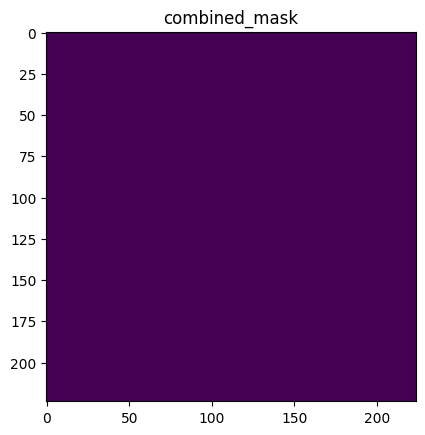

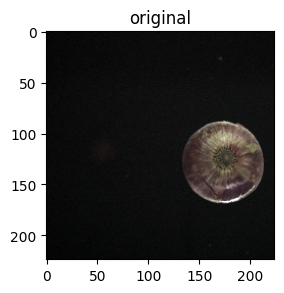

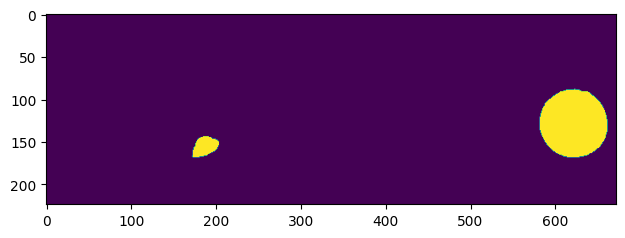

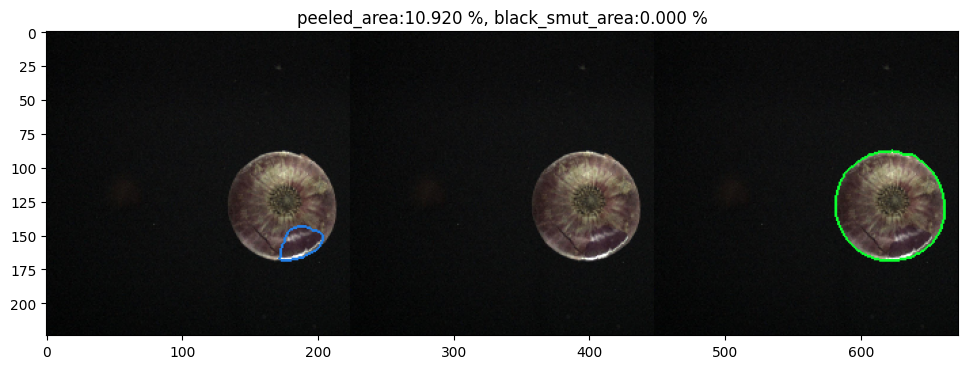

name of the image 010723_01_38_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.04478621482849121 sec


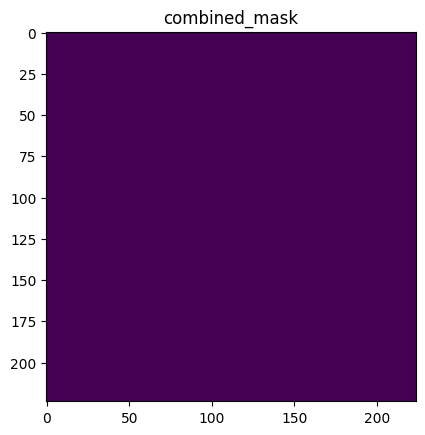

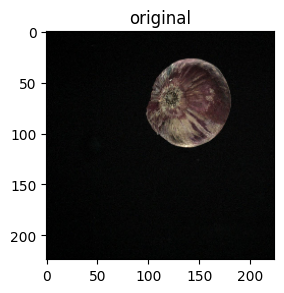

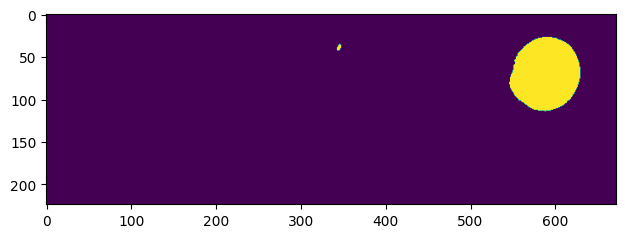

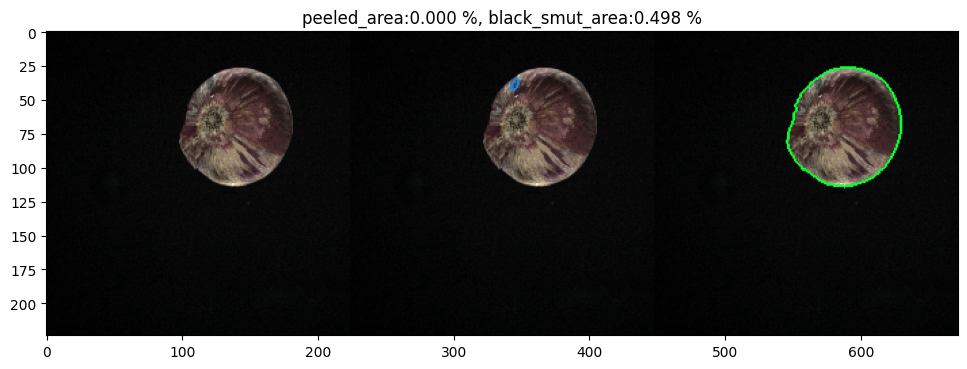

name of the image 020723_01_199_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.03608274459838867 sec


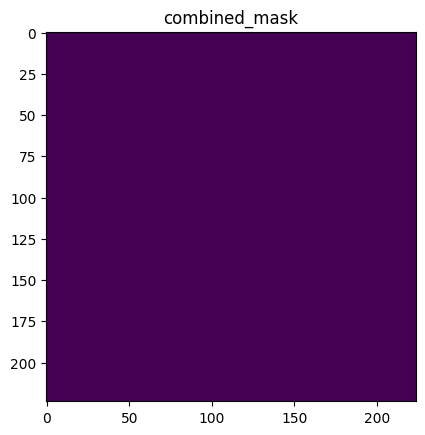

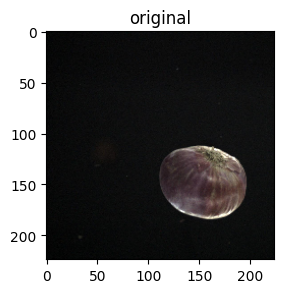

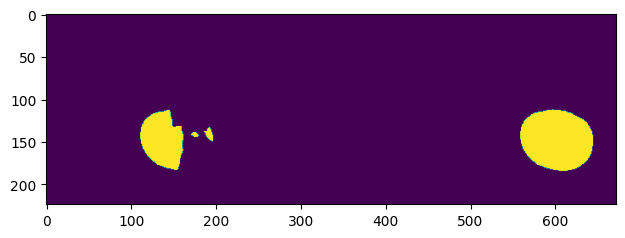

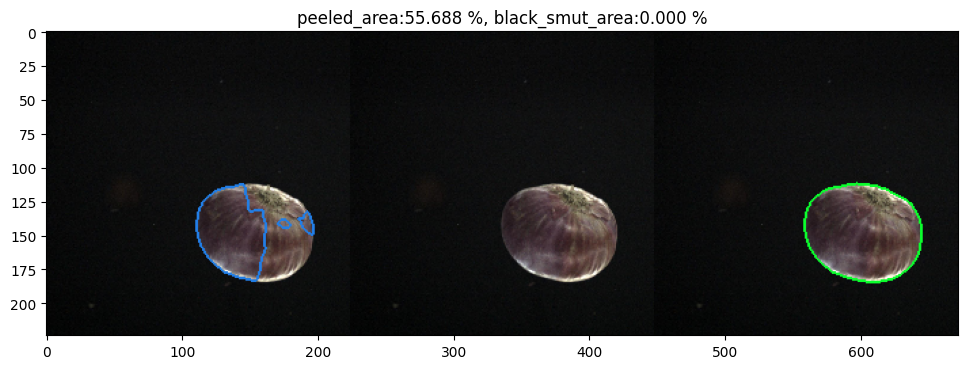

name of the image 020723_01_200_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.04161691665649414 sec


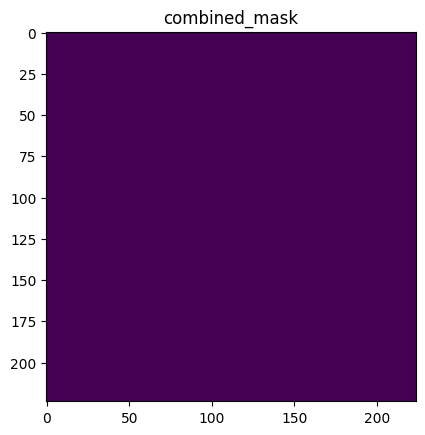

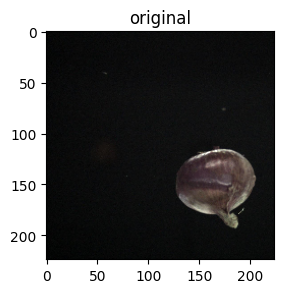

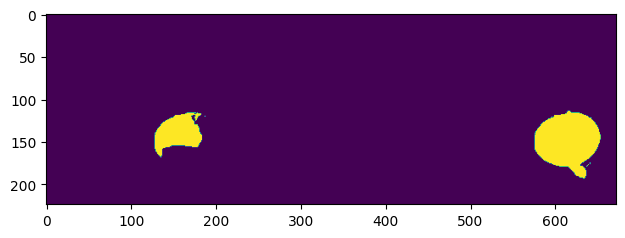

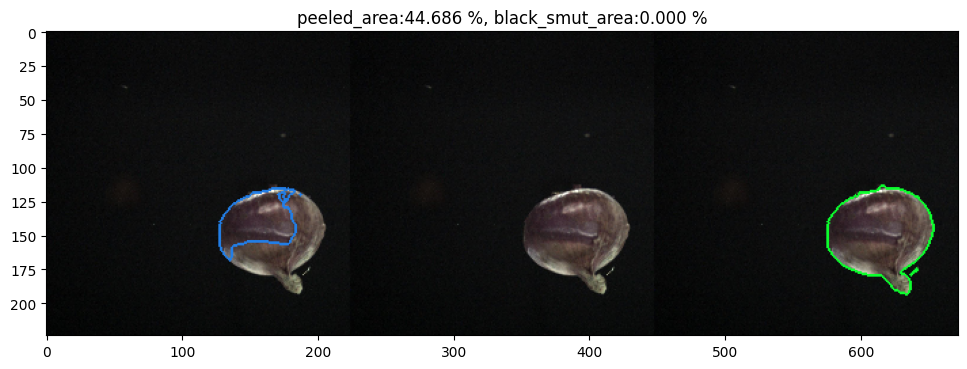

name of the image 010423_101_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.04241180419921875 sec


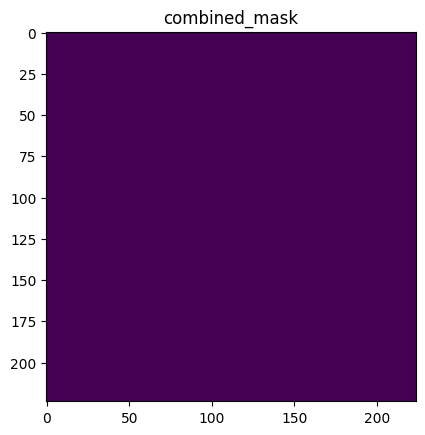

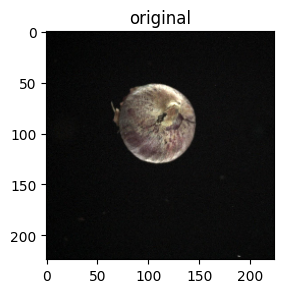

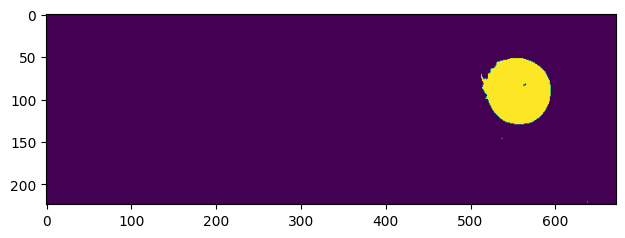

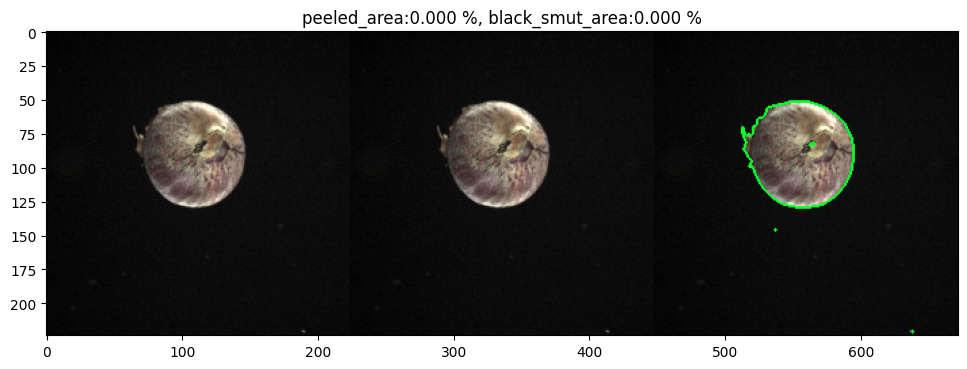

name of the image 351_1.jpg
1/1 [==============================] - 0s 22ms/step
main pred hoon: 3
Time taken for pred is :  0.04410982131958008 sec


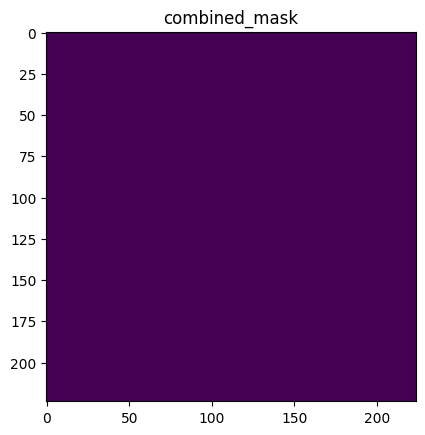

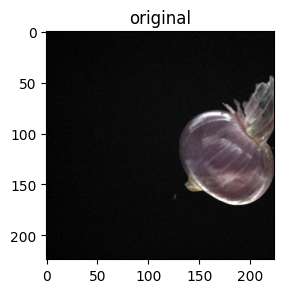

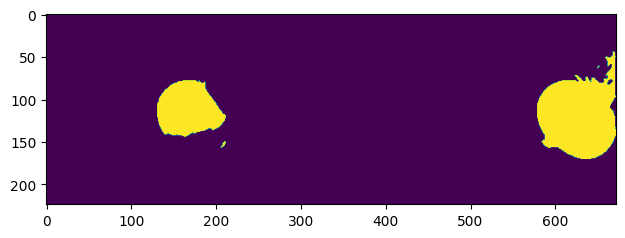

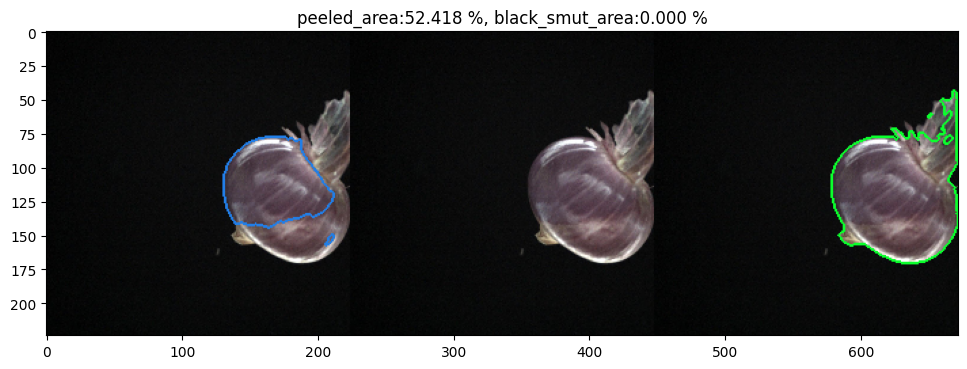

name of the image 339_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.039228200912475586 sec


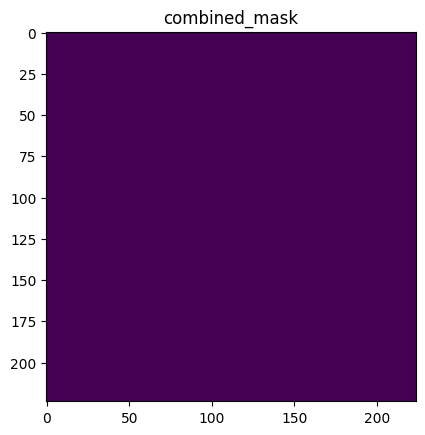

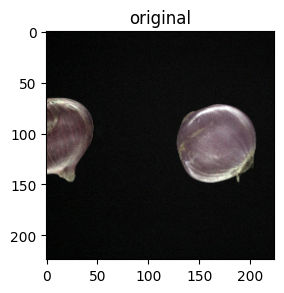

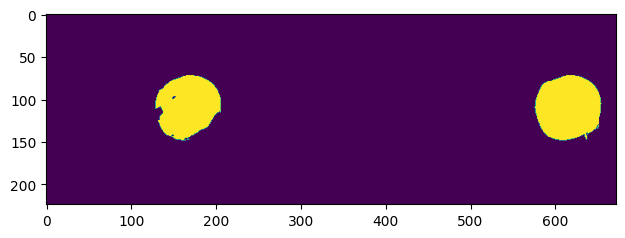

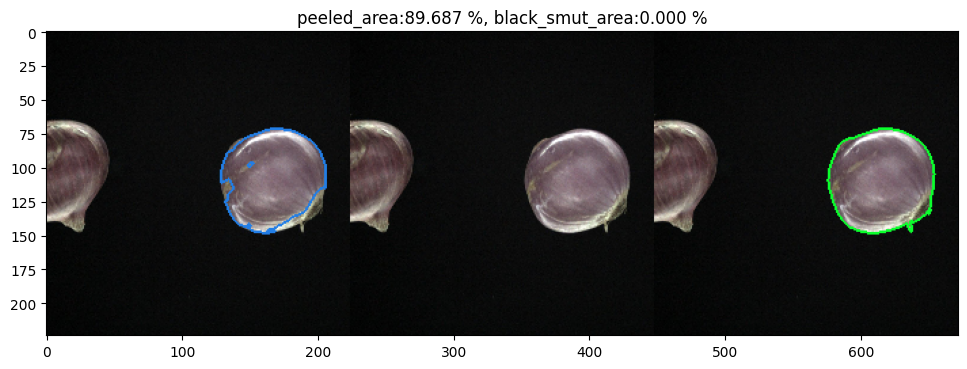

name of the image 348_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.035968780517578125 sec


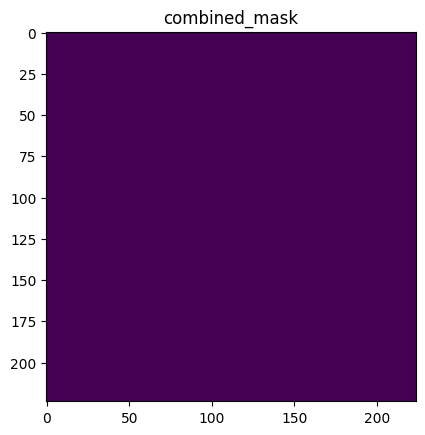

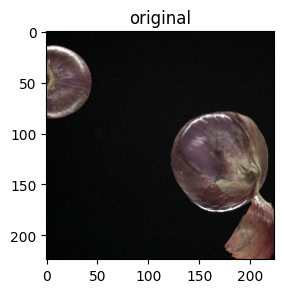

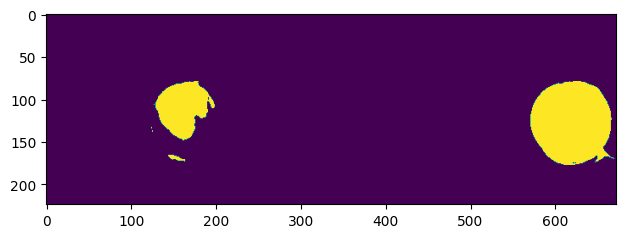

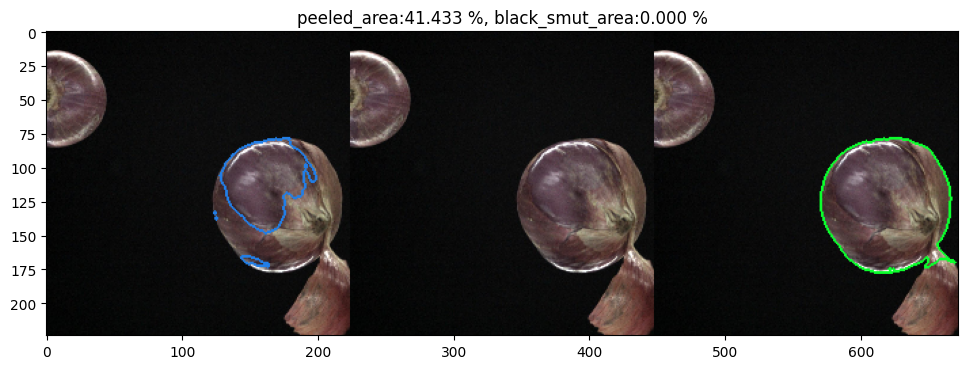

name of the image 356_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.039461374282836914 sec


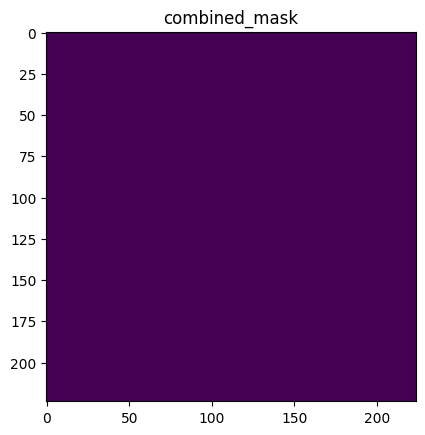

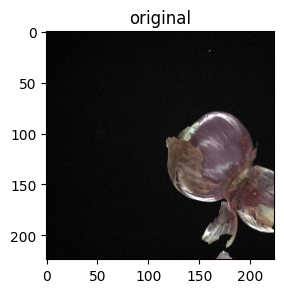

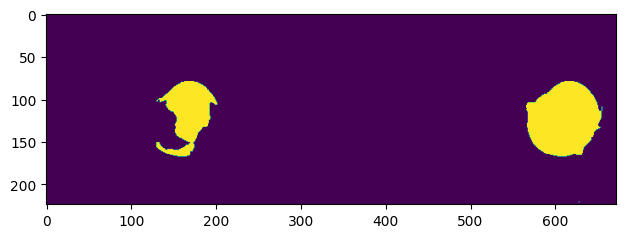

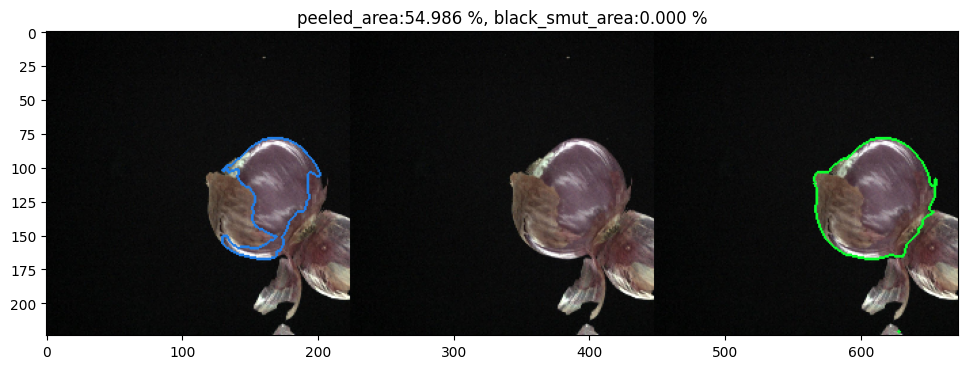

name of the image 327_1.jpg
1/1 [==============================] - 0s 19ms/step
main pred hoon: 3
Time taken for pred is :  0.039499759674072266 sec


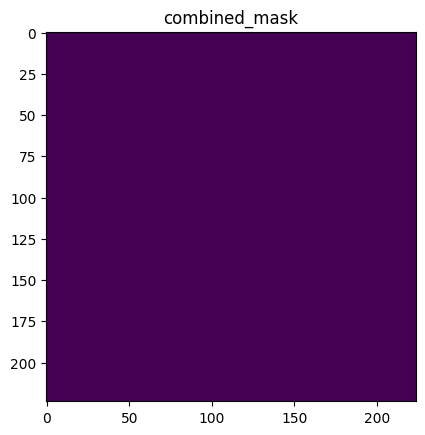

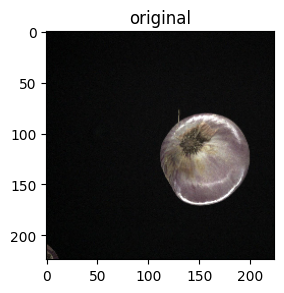

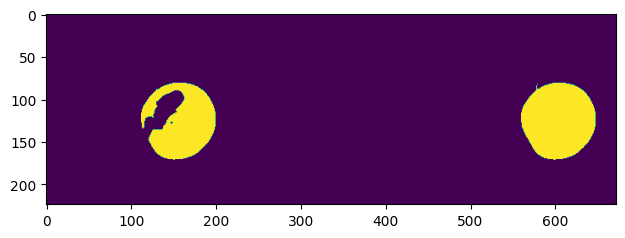

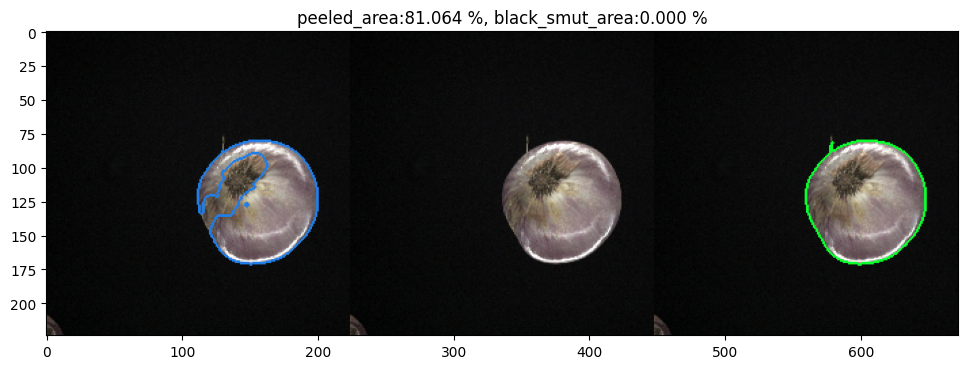

name of the image 020723_01_184_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.03687024116516113 sec


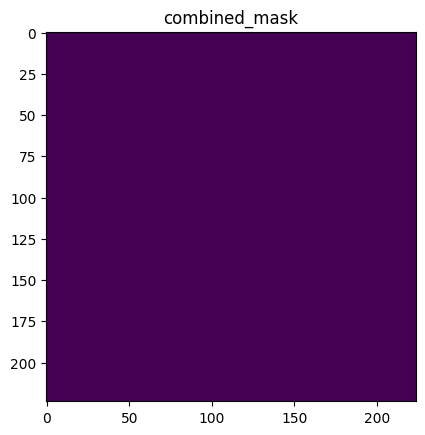

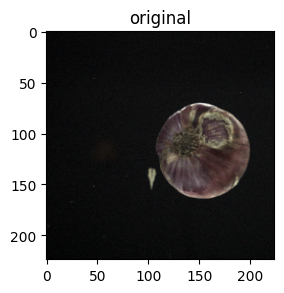

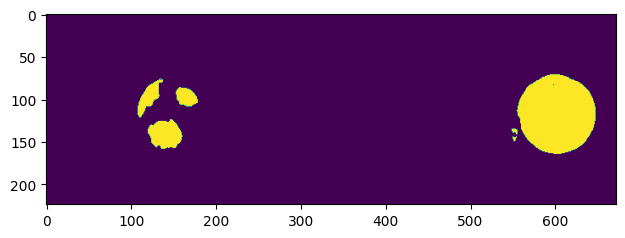

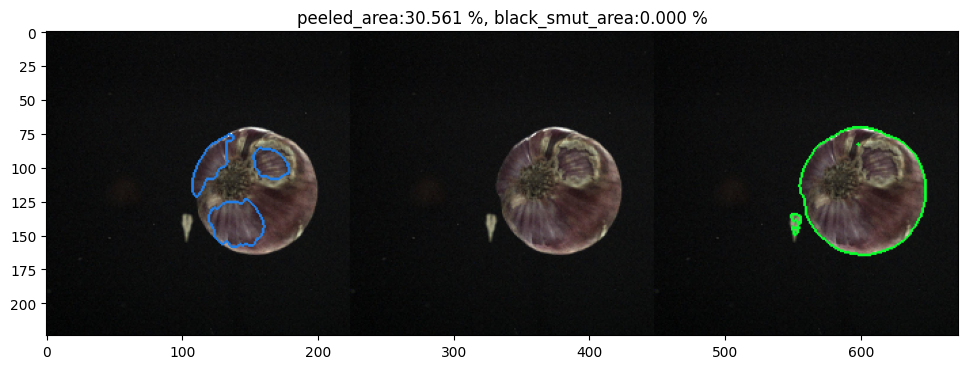

name of the image 020723_01_183_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.03689432144165039 sec


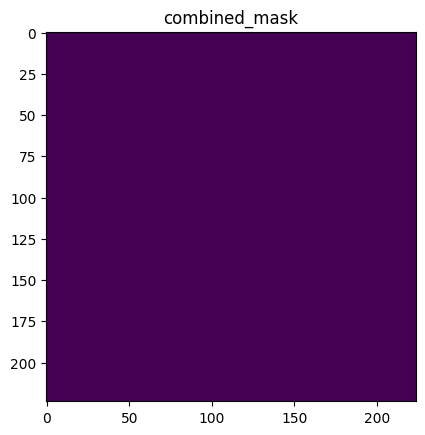

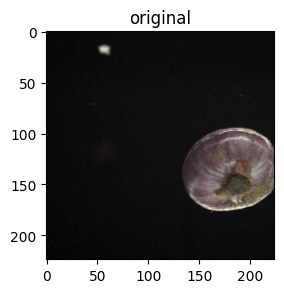

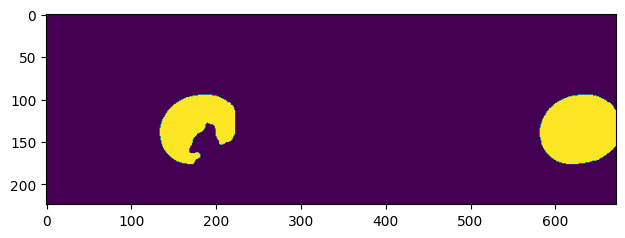

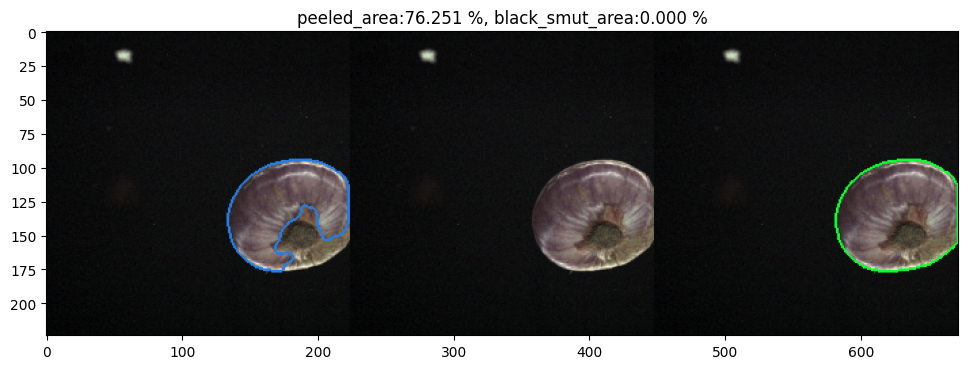

name of the image 372_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.038080453872680664 sec


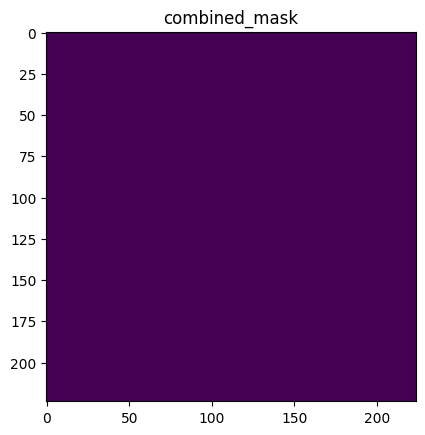

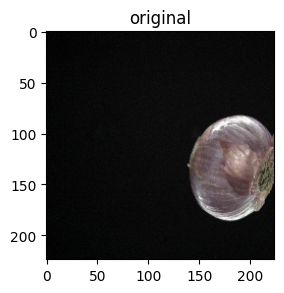

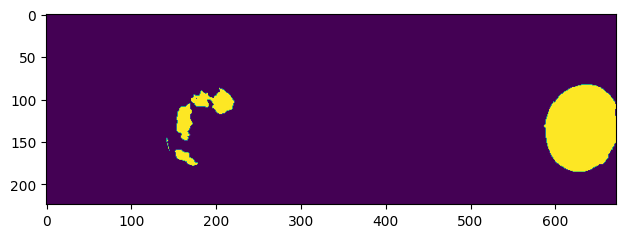

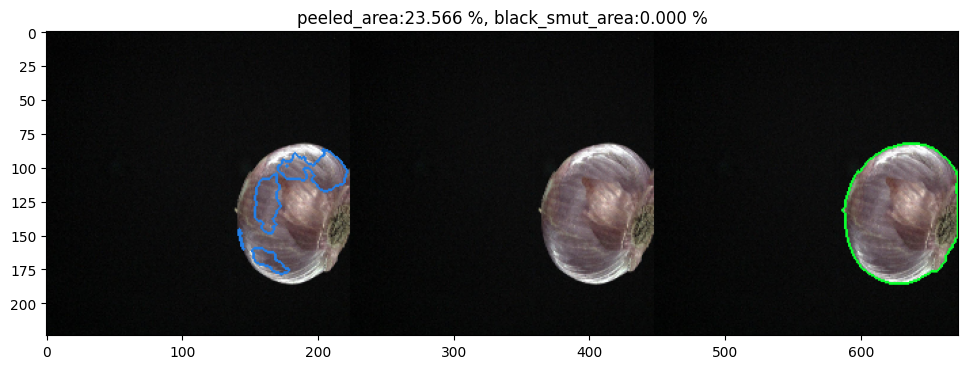

name of the image 020723_01_202_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.038167715072631836 sec


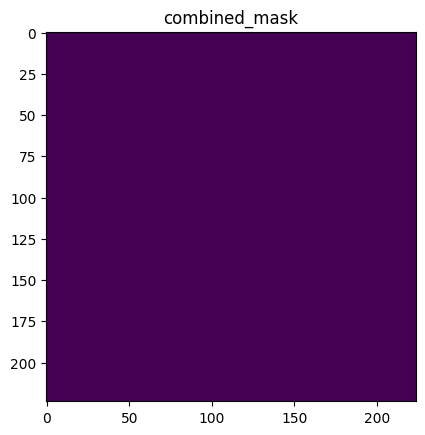

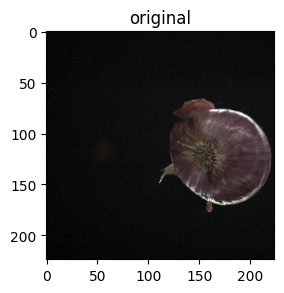

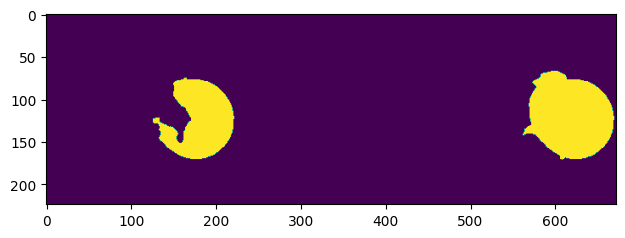

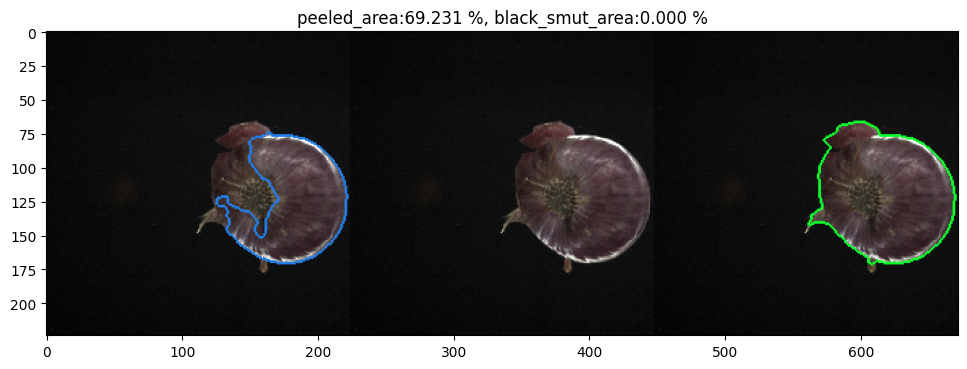

name of the image 020723_01_187_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.0351099967956543 sec


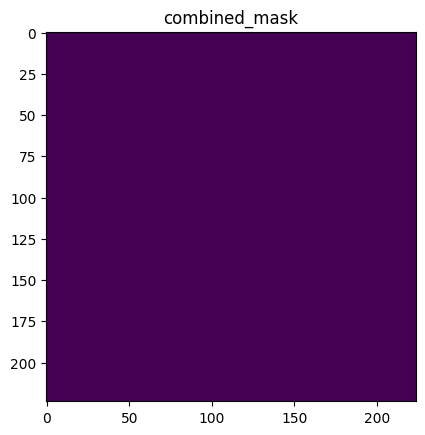

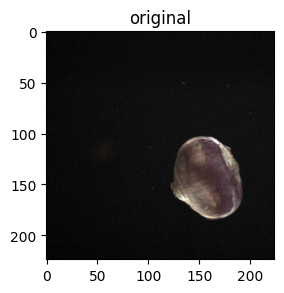

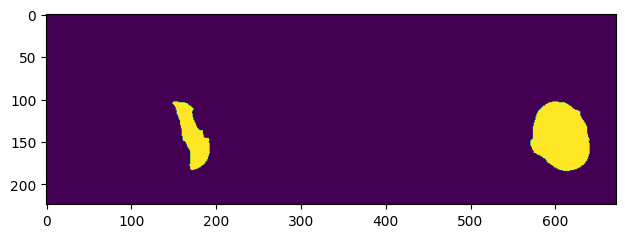

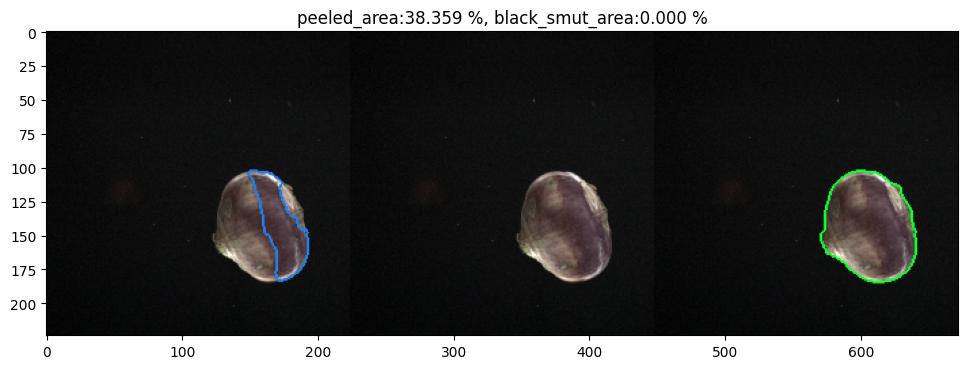

name of the image 020723_01_203_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.03615617752075195 sec


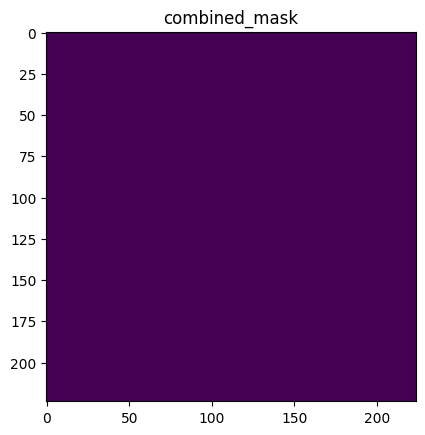

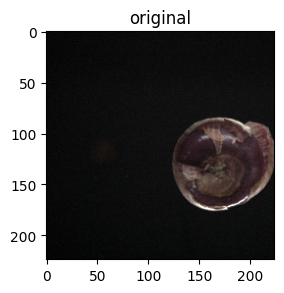

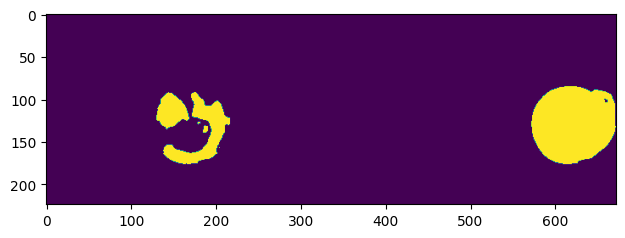

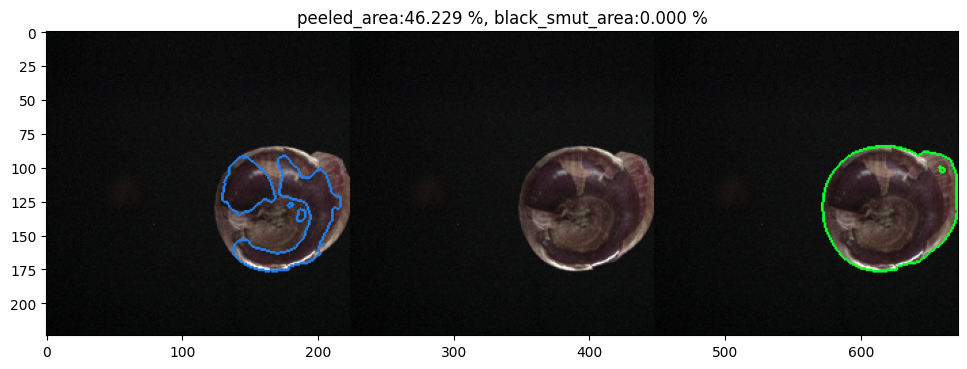

name of the image 54_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.04212665557861328 sec


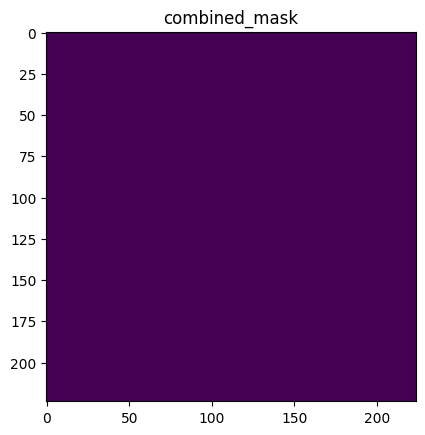

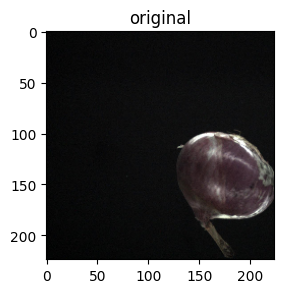

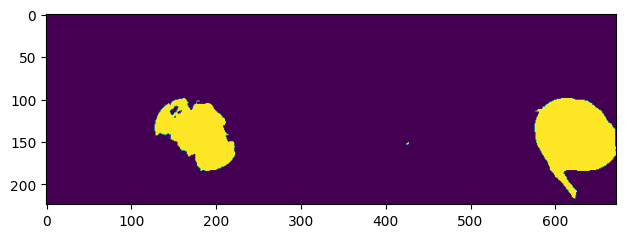

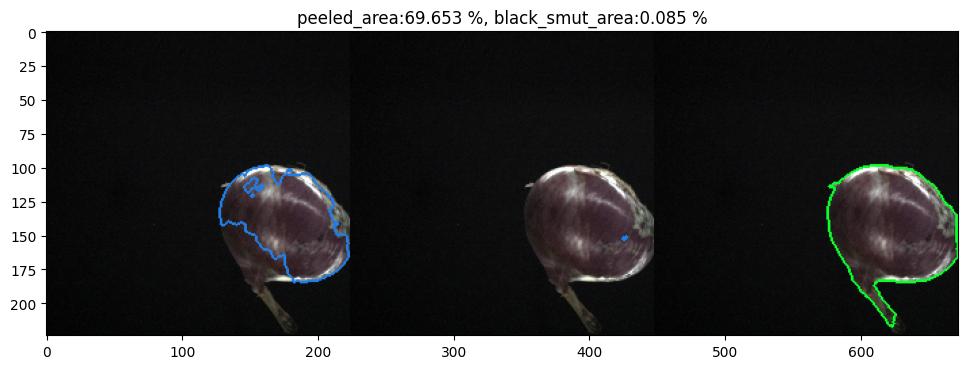

name of the image 020723_01_204_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.03870797157287598 sec


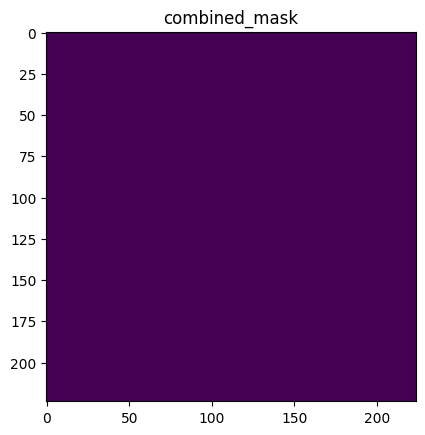

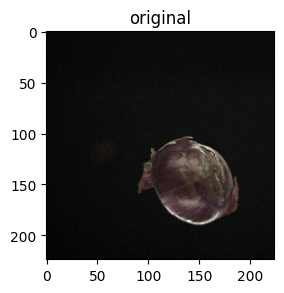

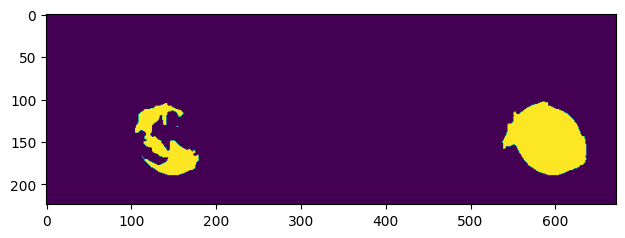

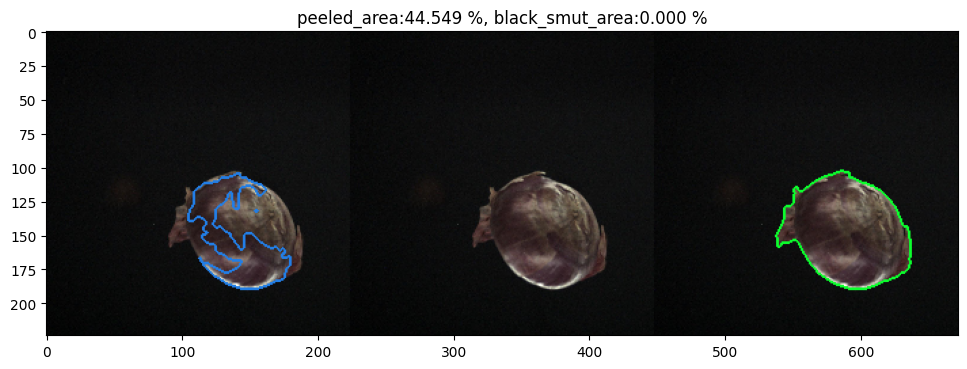

name of the image 334_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.037526607513427734 sec


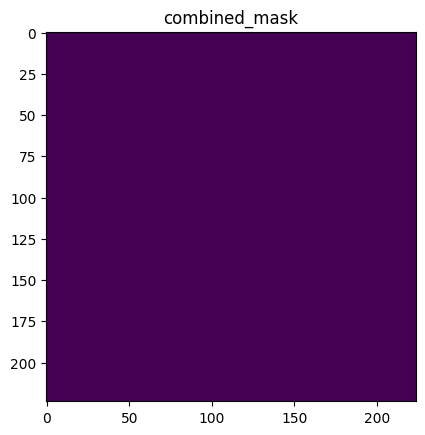

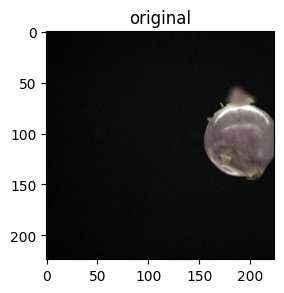

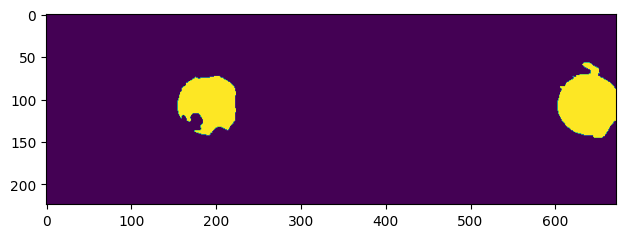

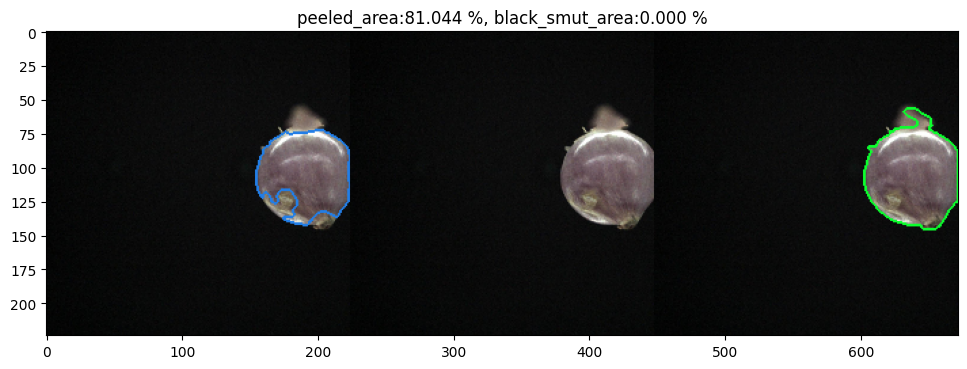

name of the image 020723_01_197_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03784894943237305 sec


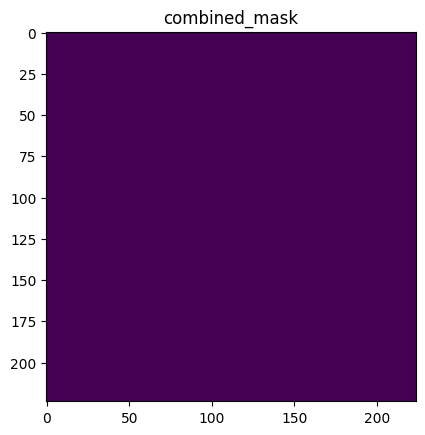

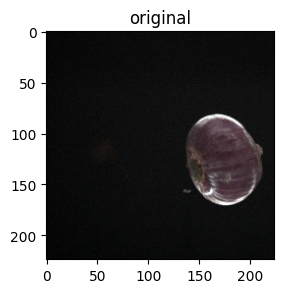

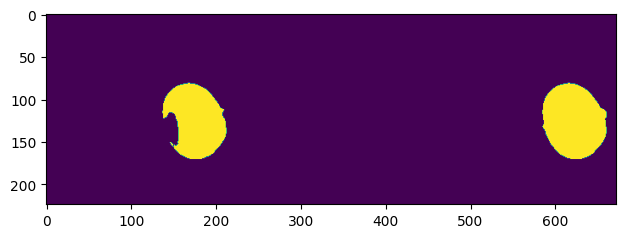

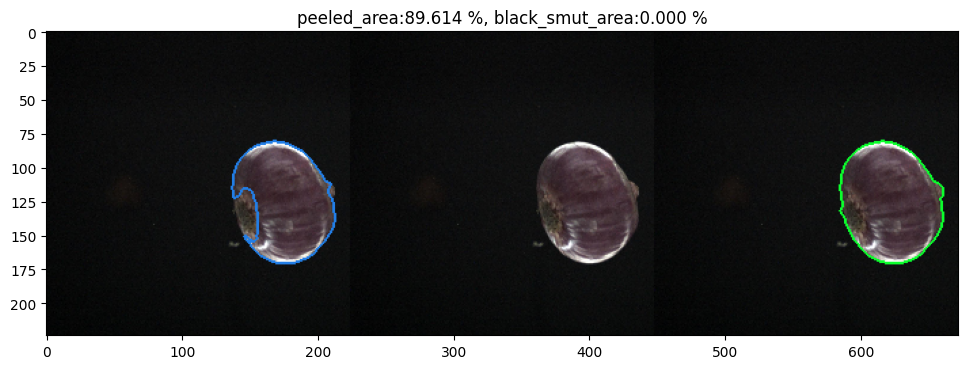

name of the image 53_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.037375450134277344 sec


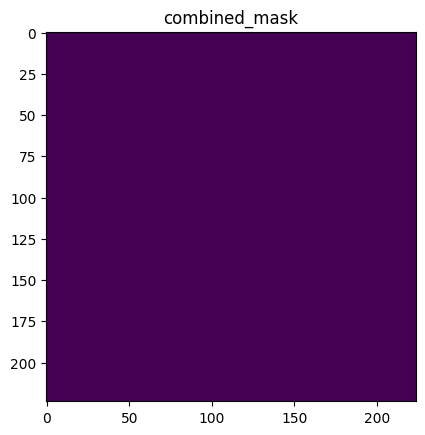

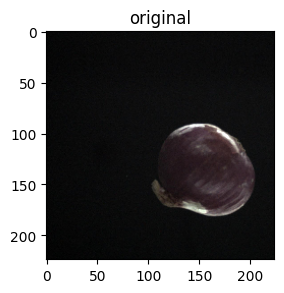

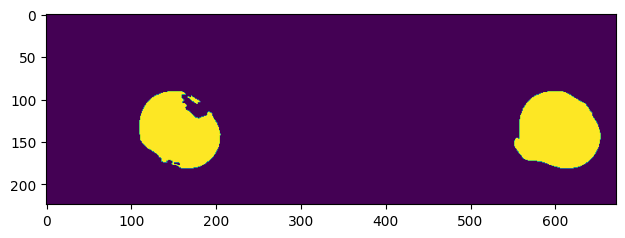

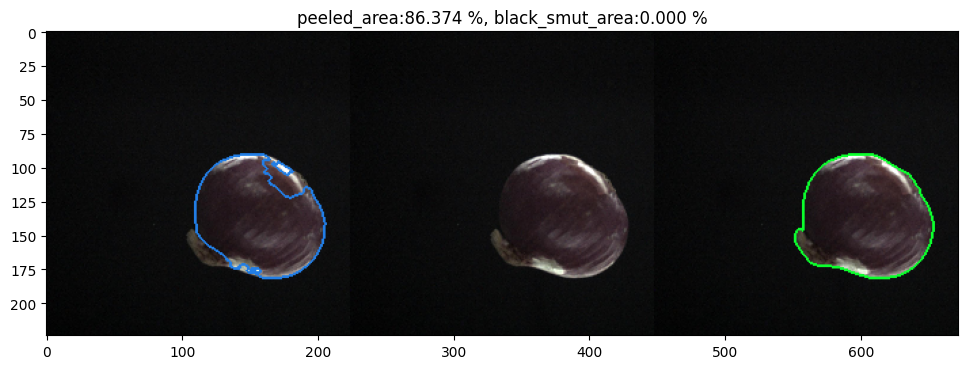

name of the image 353_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.038710832595825195 sec


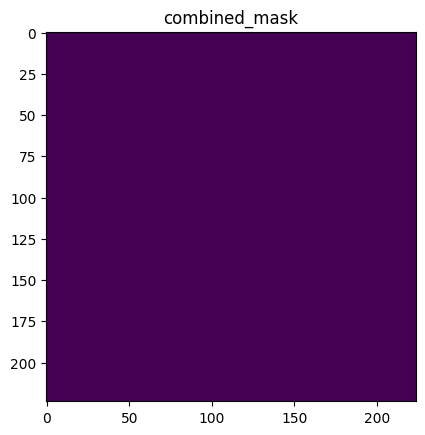

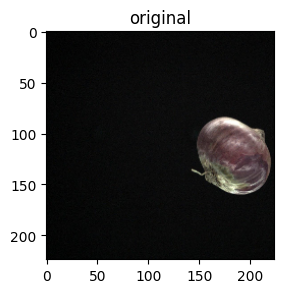

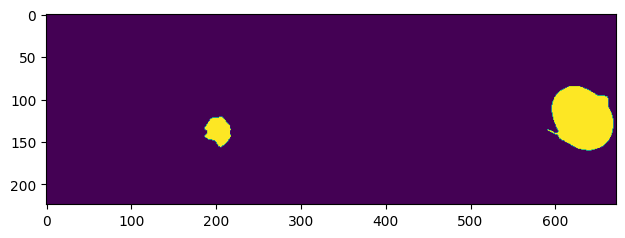

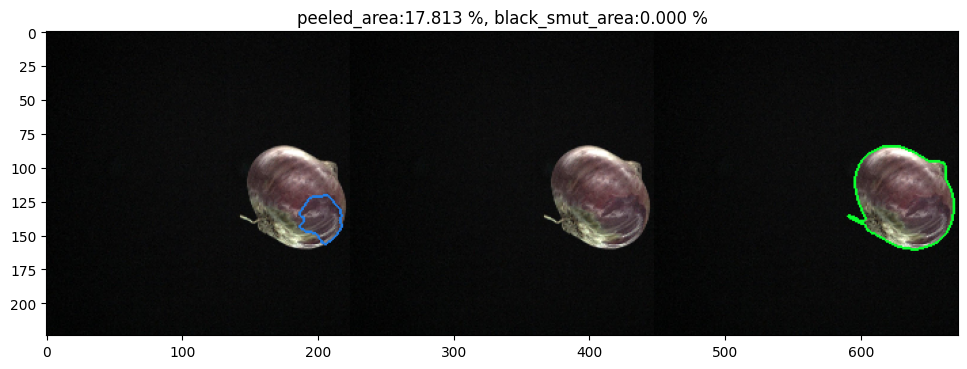

name of the image 341_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.03520488739013672 sec


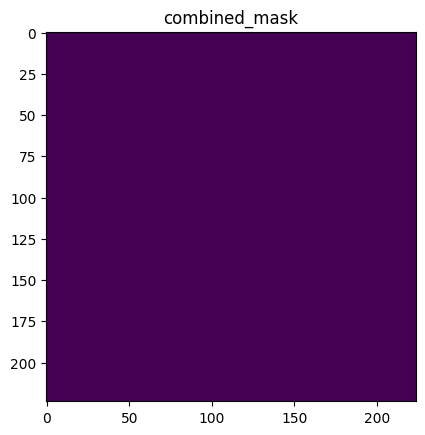

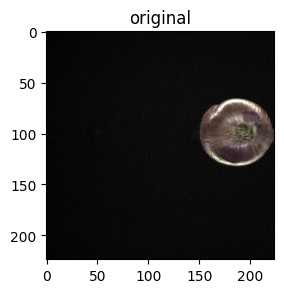

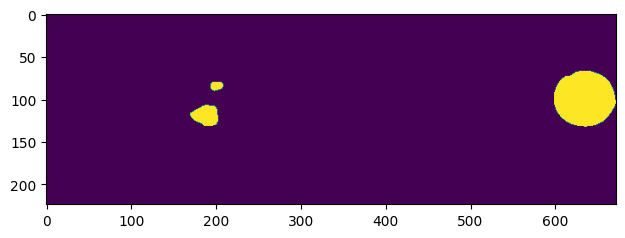

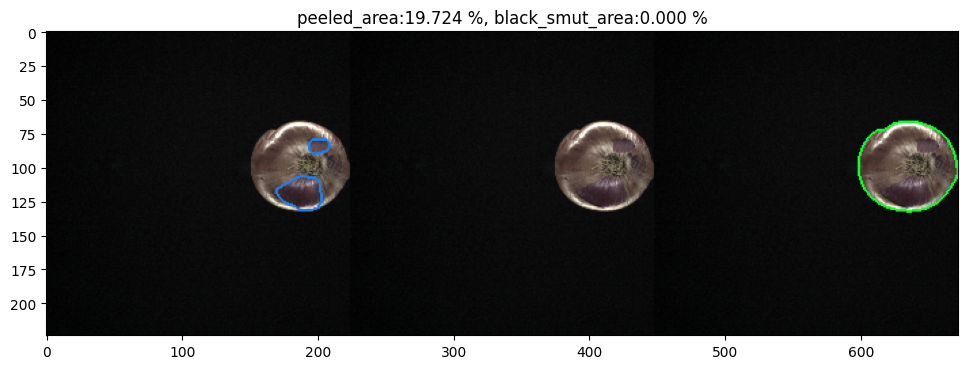

[0.0, 0.4983980064079743, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08532423208191126, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
['020723_01_196_1.jpg', '010723_01_38_1.jpg', '020723_01_199_1.jpg', '020723_01_200_1.jpg', '010423_101_1.jpg', '351_1.jpg', '339_1.jpg', '348_1.jpg', '356_1.jpg', '327_1.jpg', '020723_01_184_1.jpg', '020723_01_183_1.jpg', '372_1.jpg', '020723_01_202_1.jpg', '020723_01_187_1.jpg', '020723_01_203_1.jpg', '54_1.jpg', '020723_01_204_1.jpg', '334_1.jpg', '020723_01_197_1.jpg', '53_1.jpg', '353_1.jpg', '341_1.jpg']


In [14]:
img_path=r'/home/agrograde/Desktop/12th_june/old_summer_onion/test/test_images/peeled'
getPrediction(img_path)

name of the image 130423_31_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.037512779235839844 sec


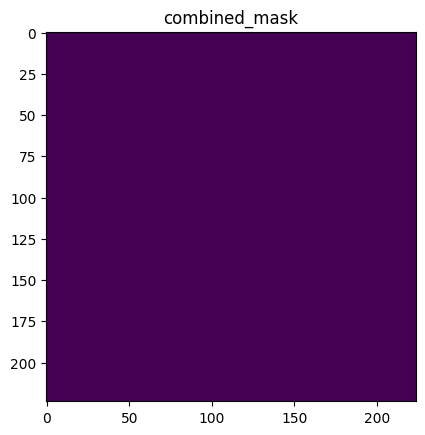

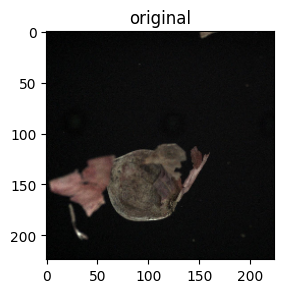

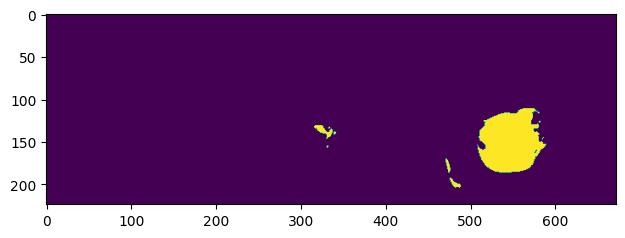

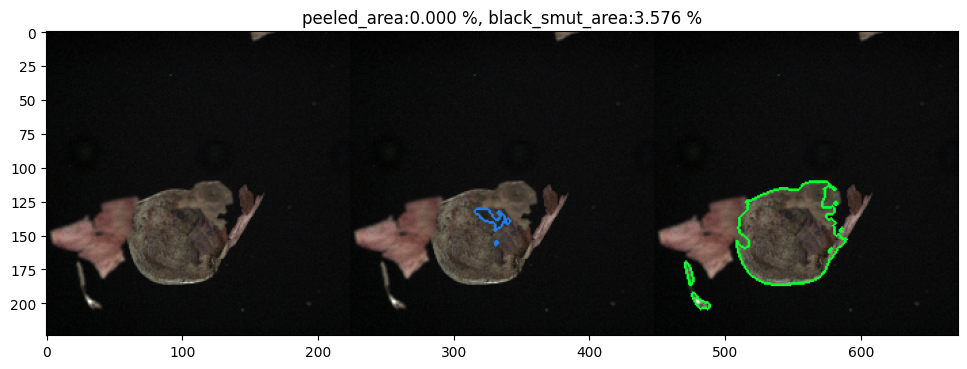

name of the image 130423_107_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.04114484786987305 sec


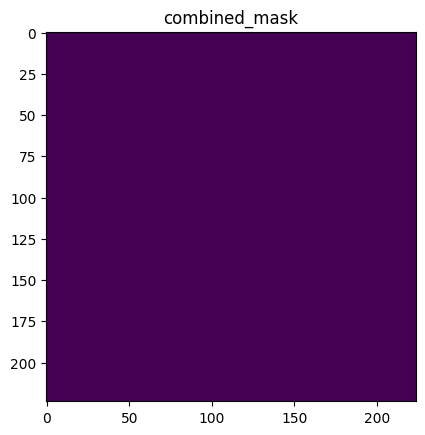

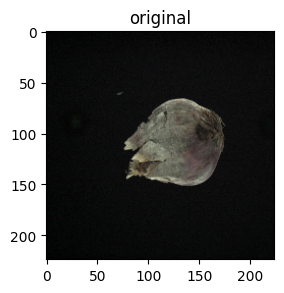

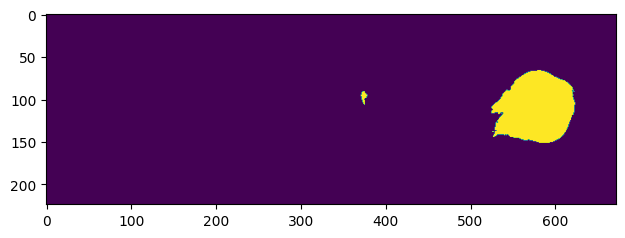

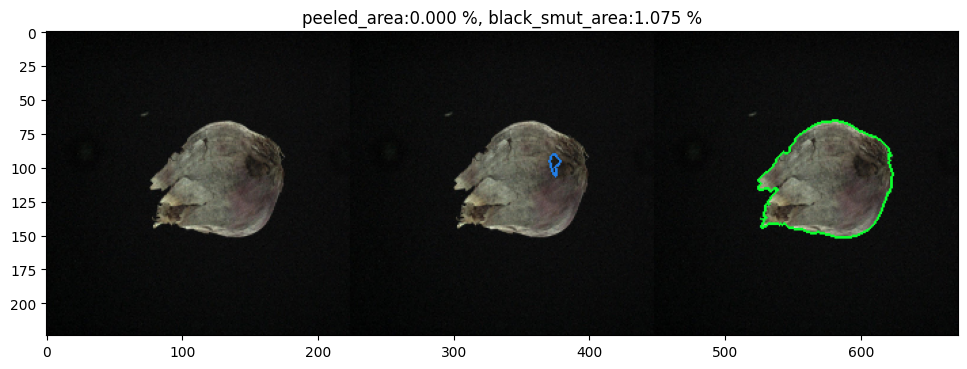

name of the image 130423_101_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.04253125190734863 sec


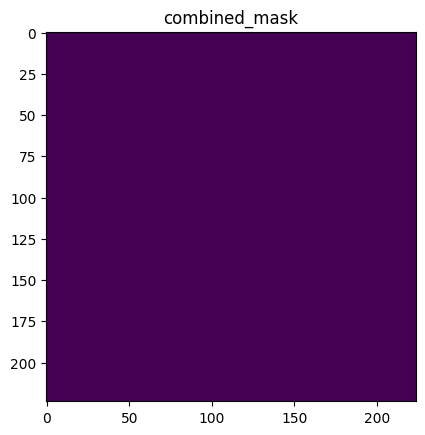

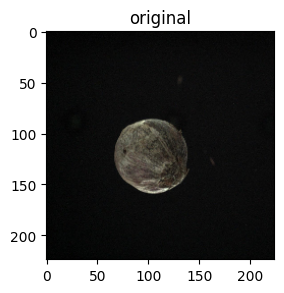

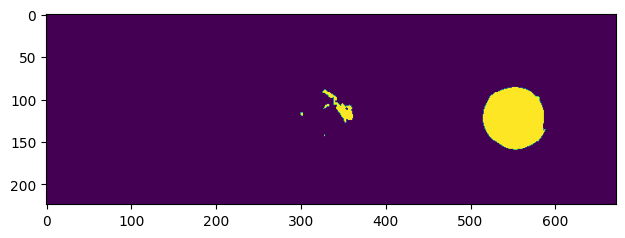

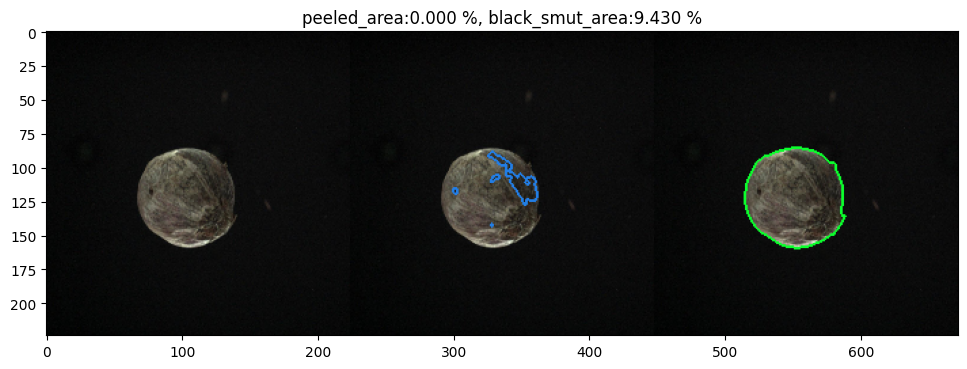

name of the image 130423_49_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.03737998008728027 sec


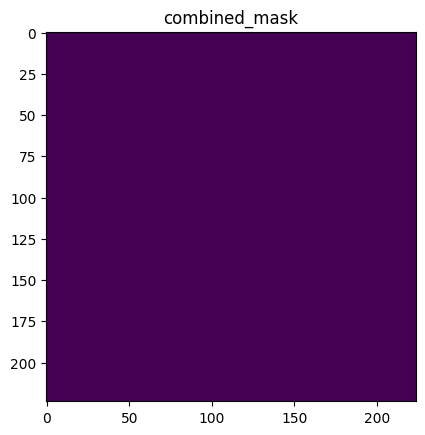

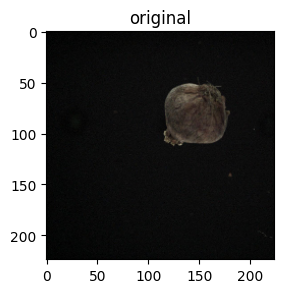

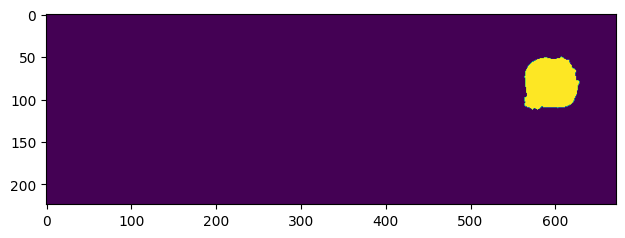

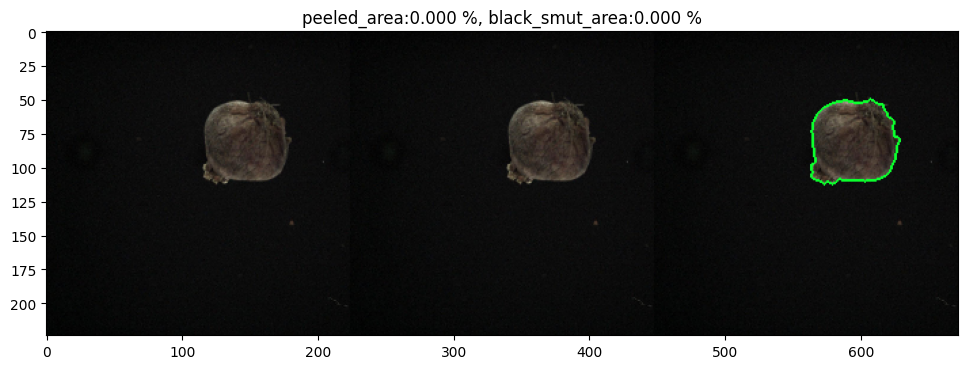

name of the image 130423_35_1.jpg
1/1 [==============================] - 0s 19ms/step
main pred hoon: 3
Time taken for pred is :  0.04395890235900879 sec


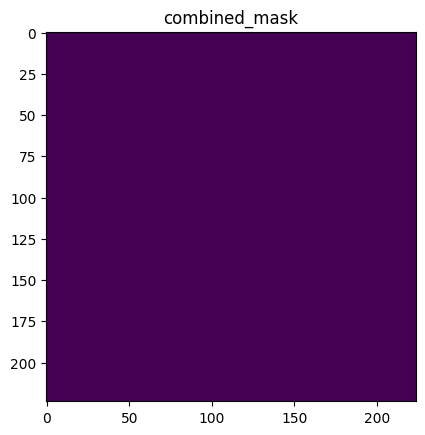

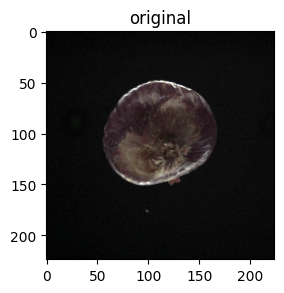

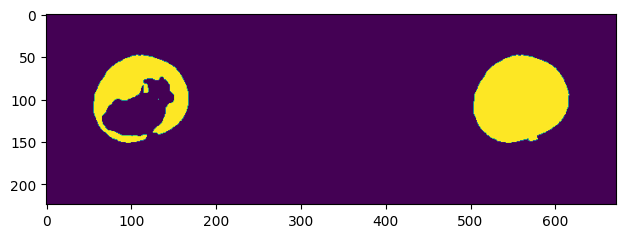

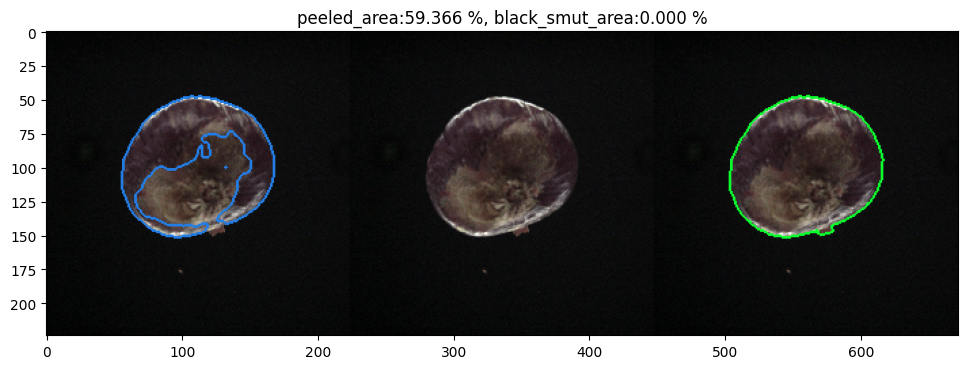

name of the image 130423_61_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.0382232666015625 sec


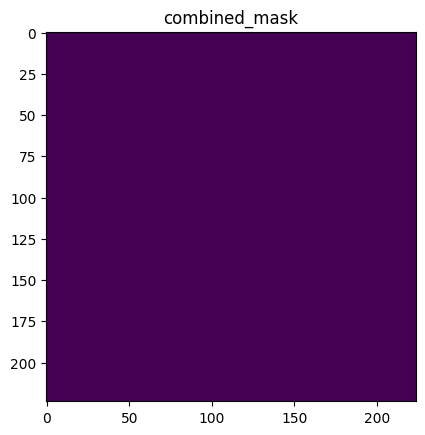

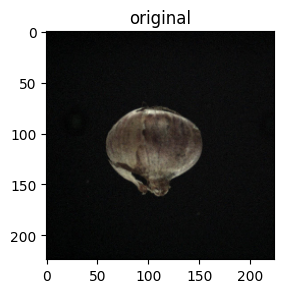

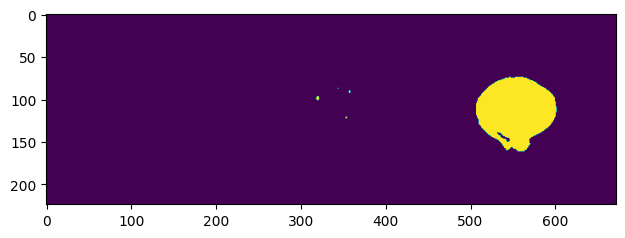

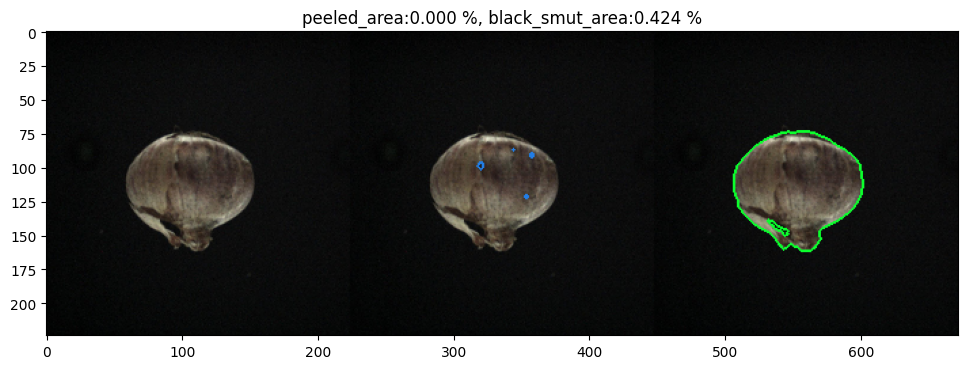

name of the image 140423_170_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.0379488468170166 sec


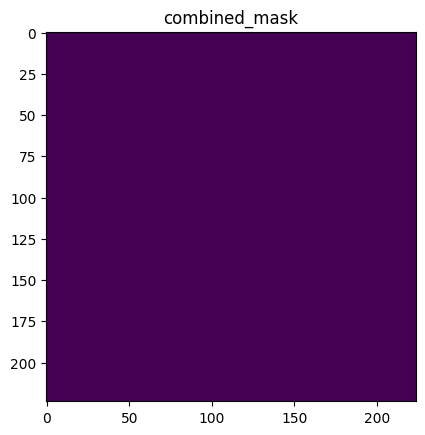

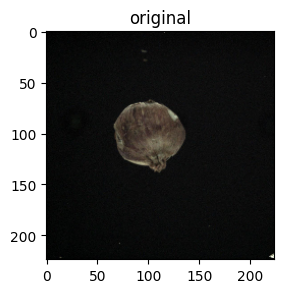

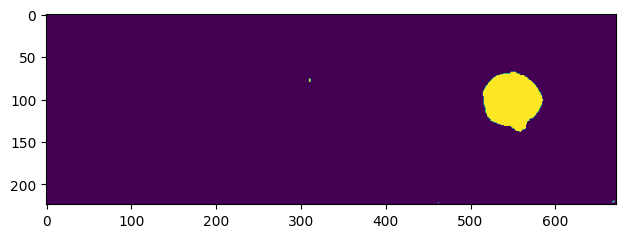

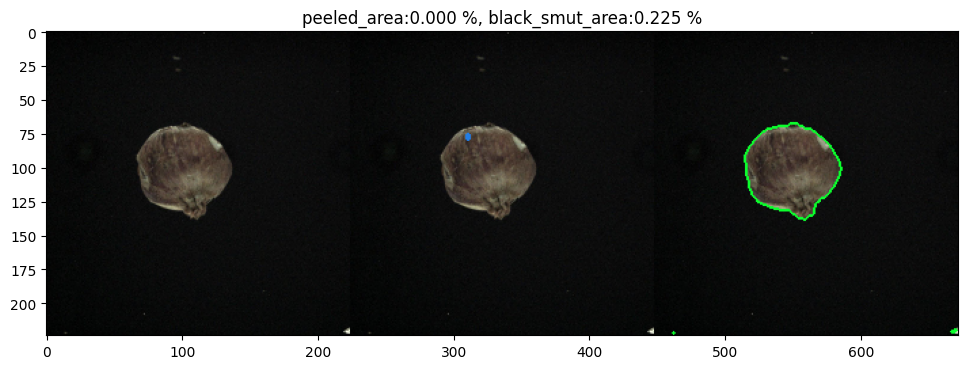

name of the image 130423_90_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.037427663803100586 sec


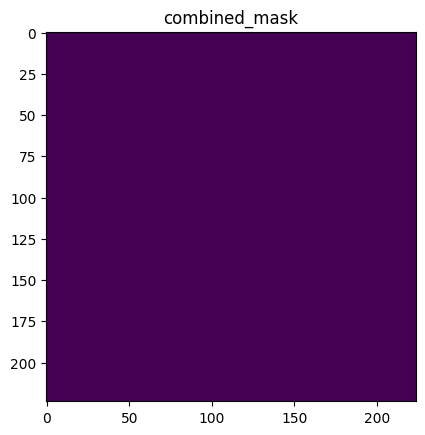

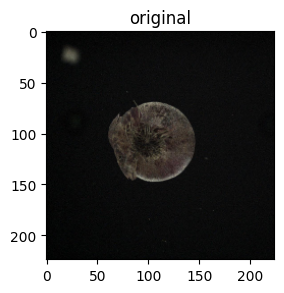

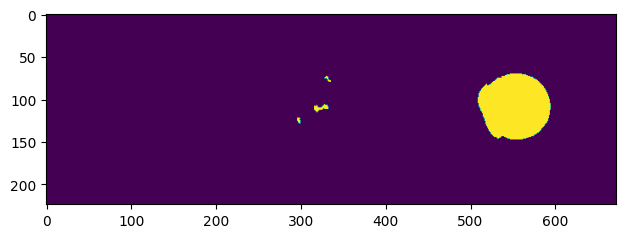

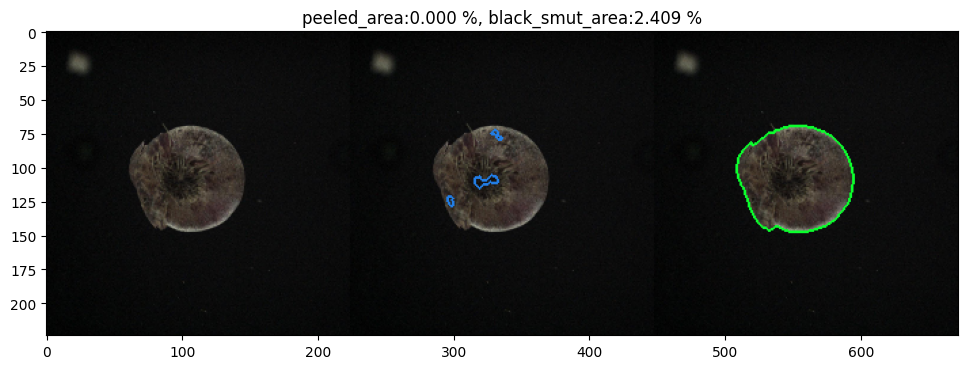

name of the image 130423_65_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.04194378852844238 sec


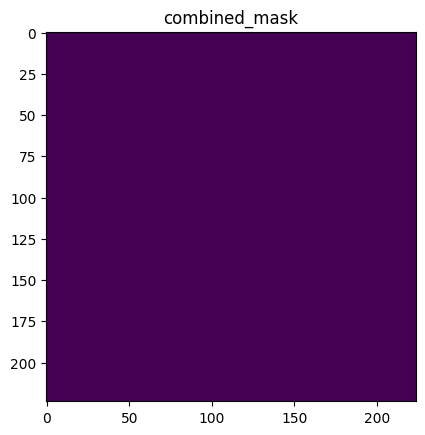

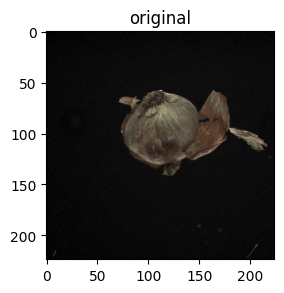

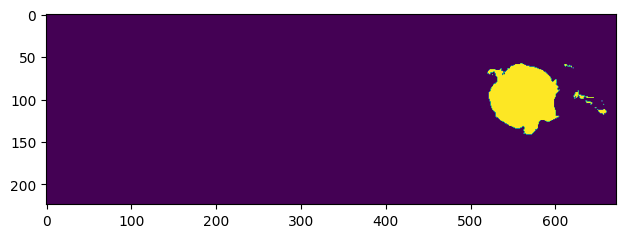

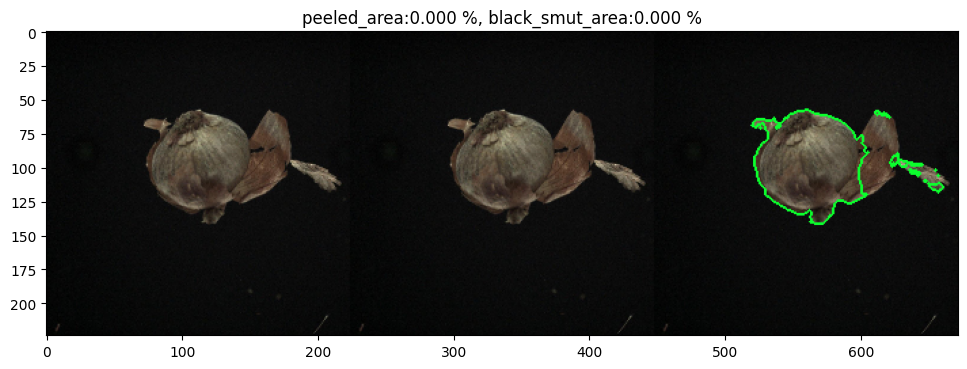

name of the image 140423_202_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.0387723445892334 sec


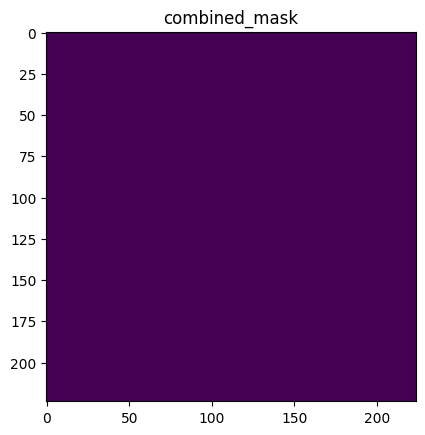

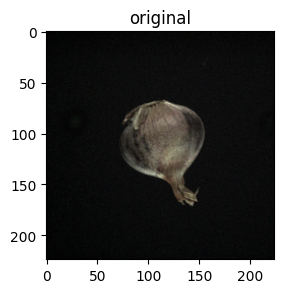

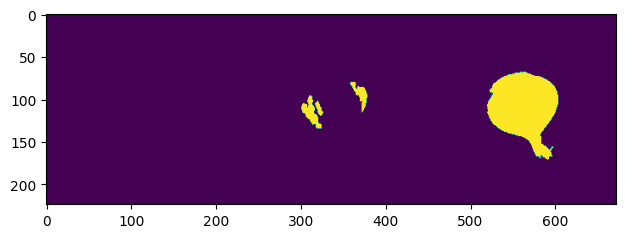

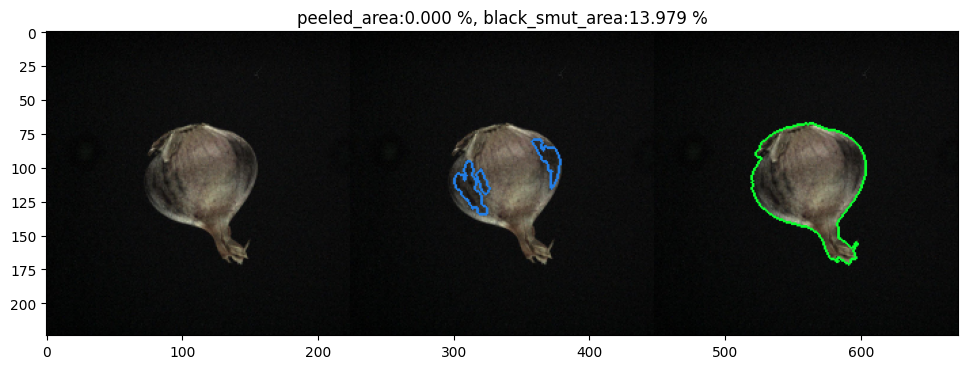

name of the image 140423_233_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.03647112846374512 sec


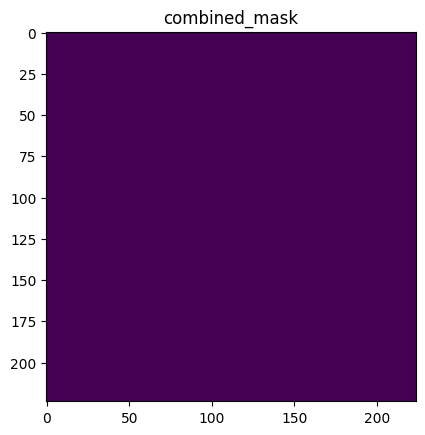

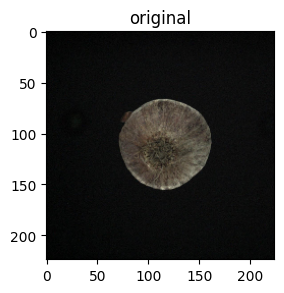

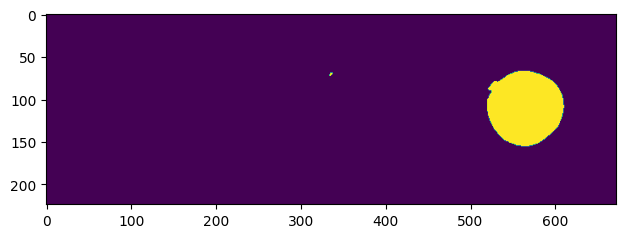

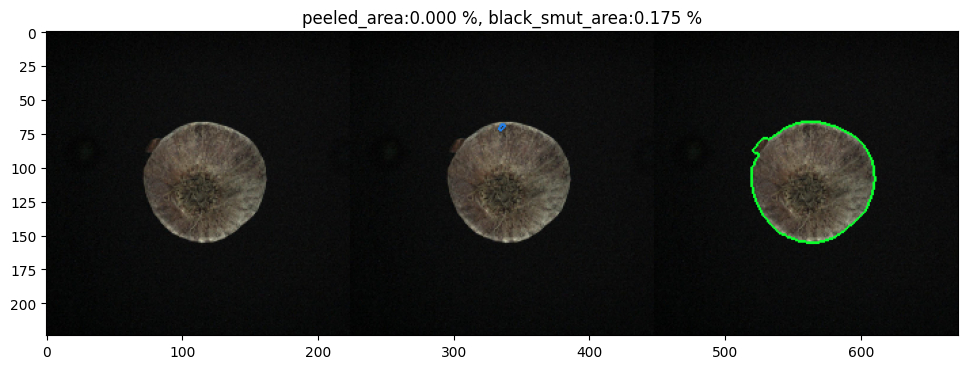

name of the image 140423_203_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.0362086296081543 sec


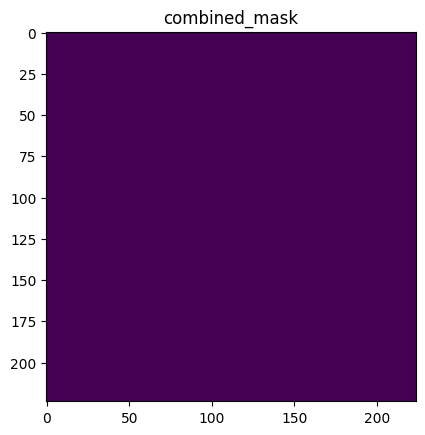

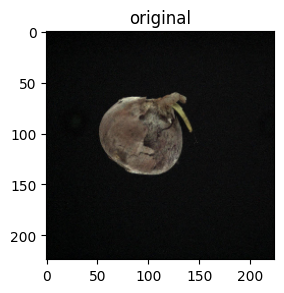

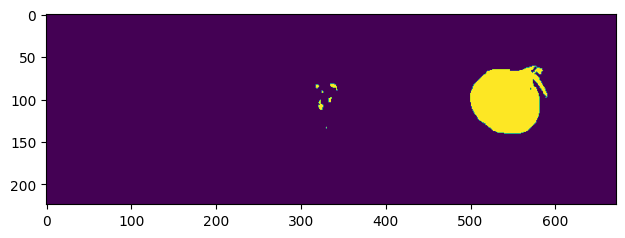

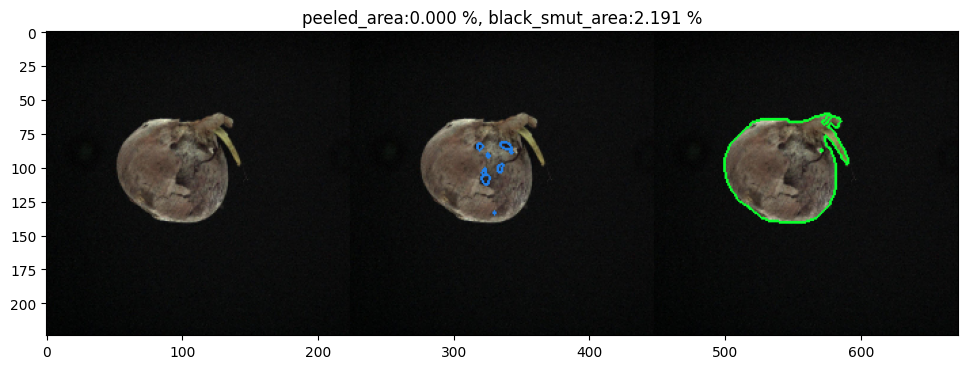

name of the image 130423_138_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03768348693847656 sec


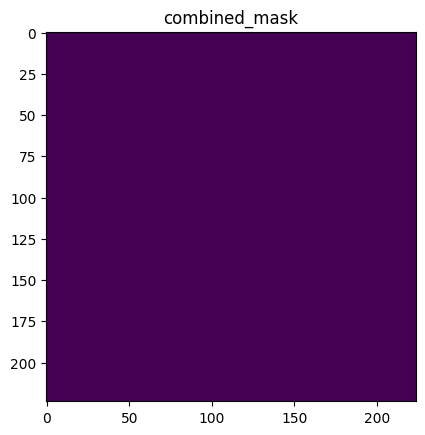

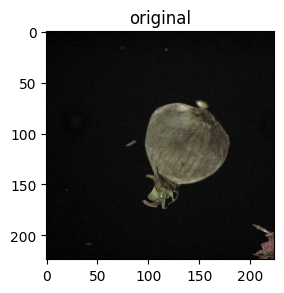

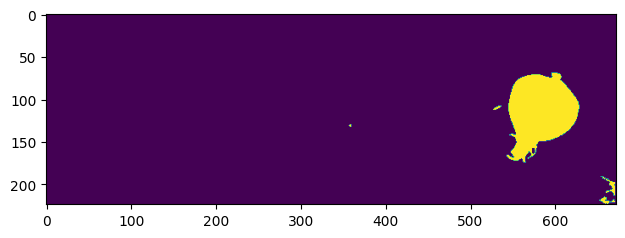

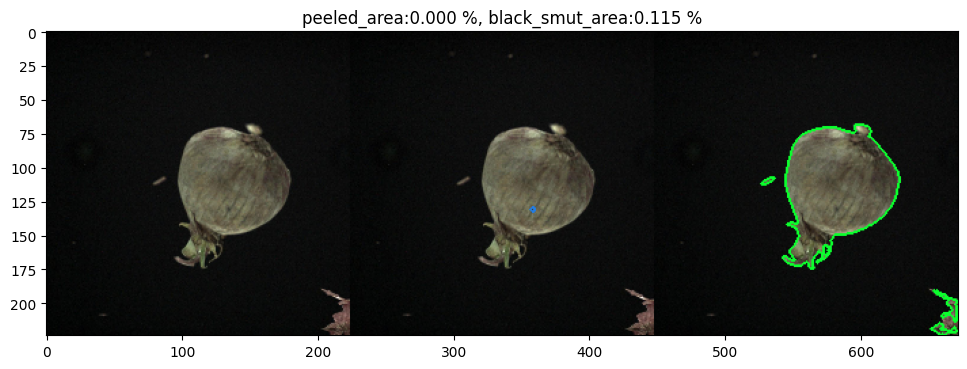

name of the image 130523_353_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.05108761787414551 sec


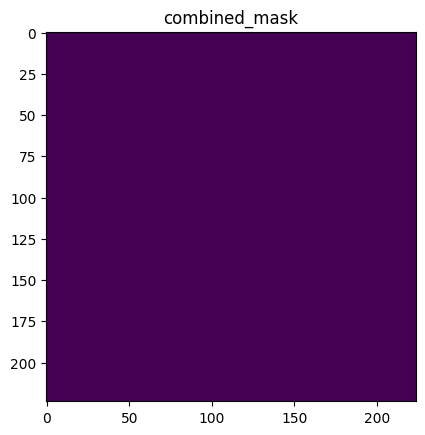

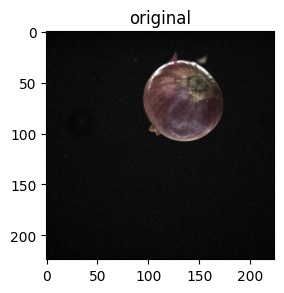

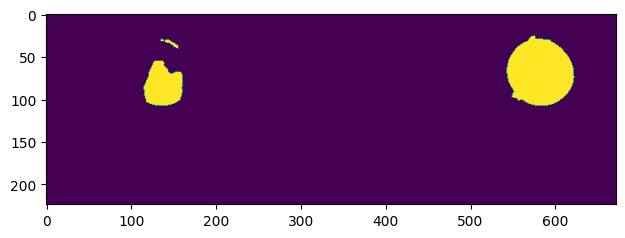

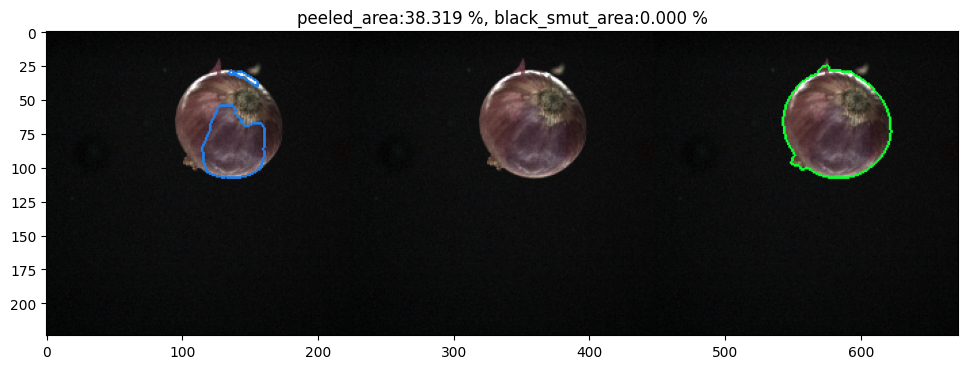

name of the image 130523_282_1.jpg
1/1 [==============================] - 0s 20ms/step
main pred hoon: 3
Time taken for pred is :  0.04532146453857422 sec


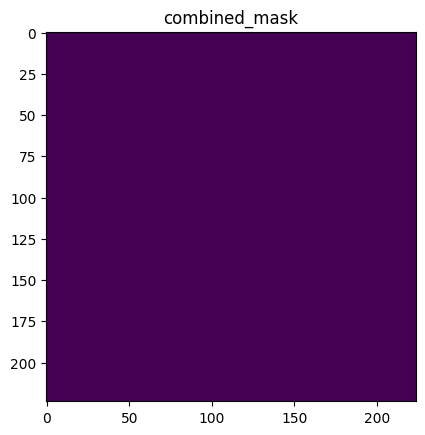

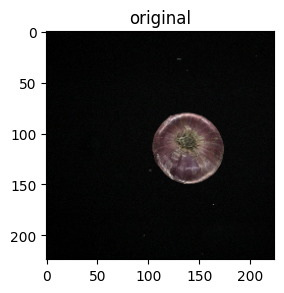

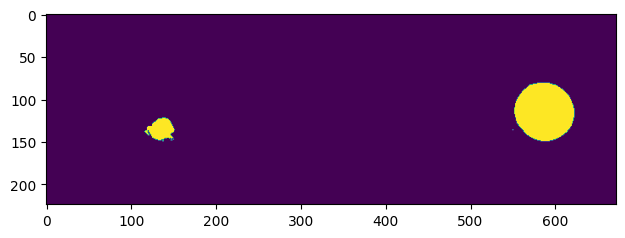

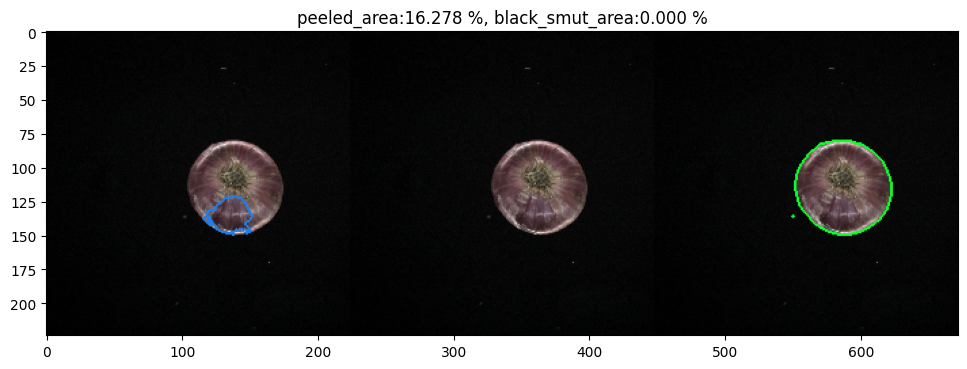

name of the image 130423_44_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.03496384620666504 sec


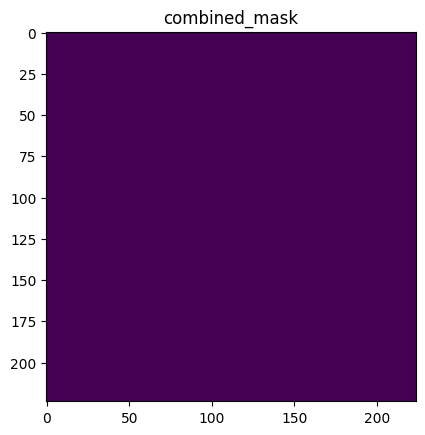

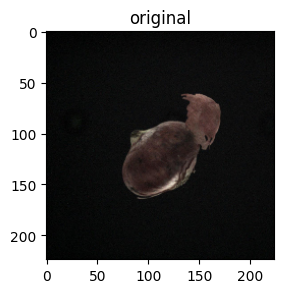

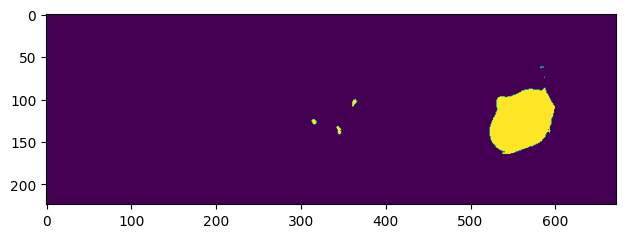

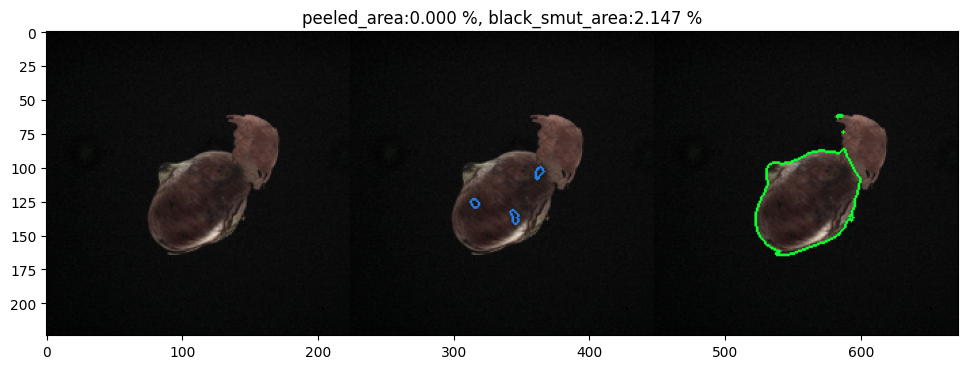

name of the image 130423_74_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.04147672653198242 sec


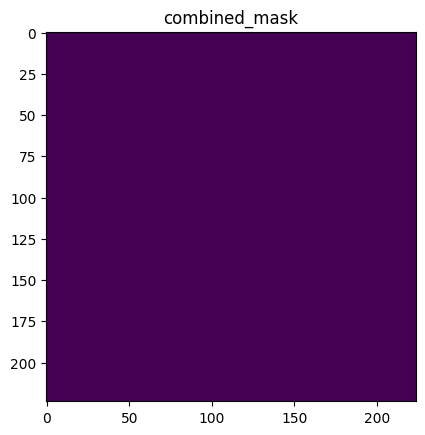

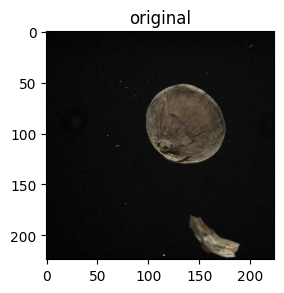

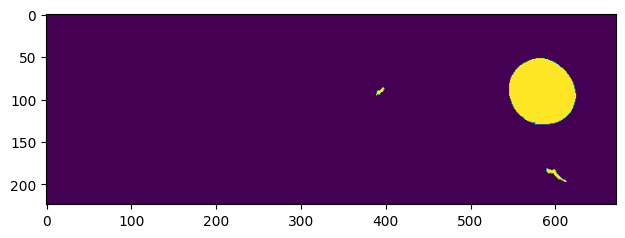

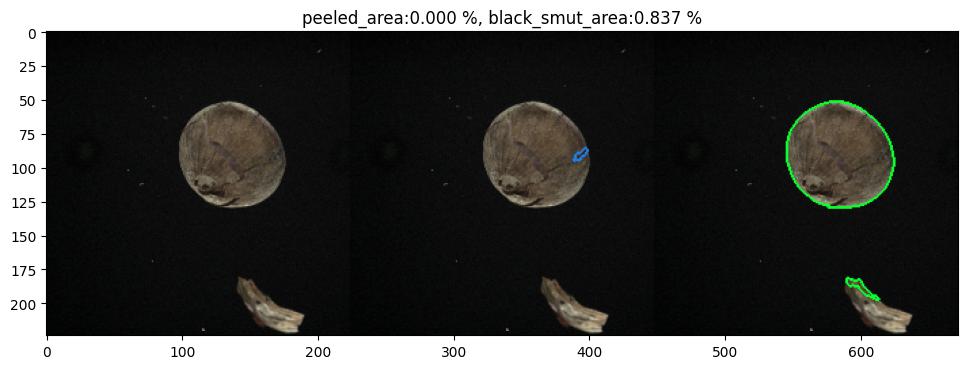

name of the image 140423_227_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.03490495681762695 sec


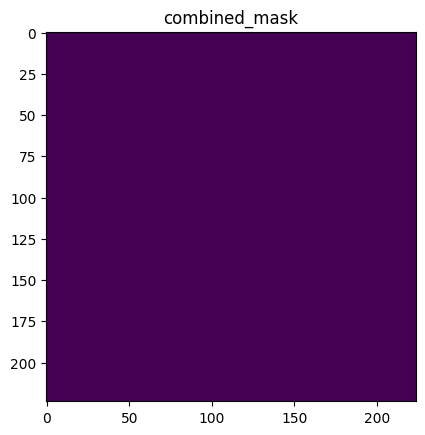

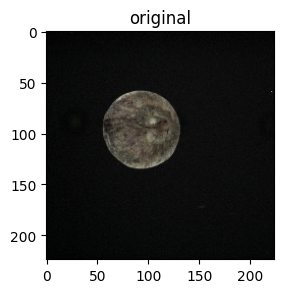

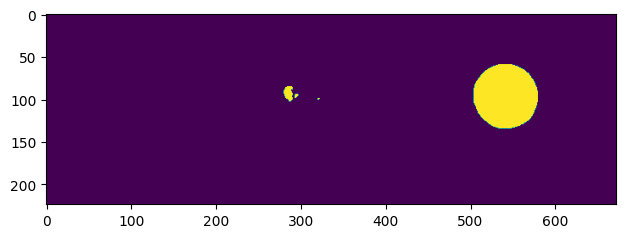

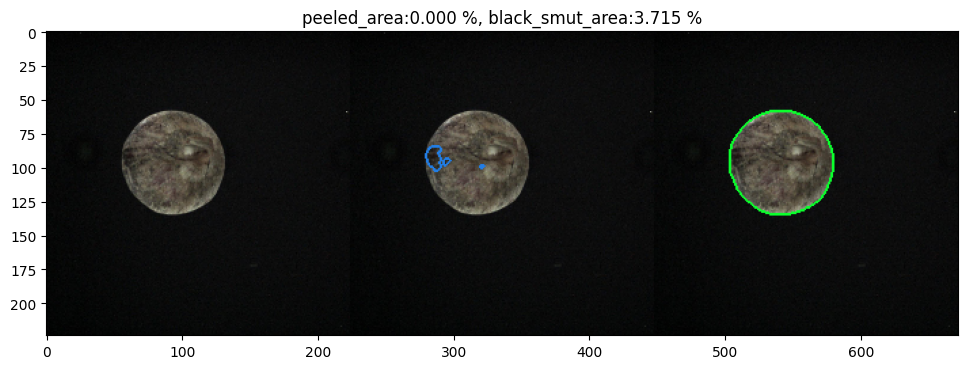

name of the image 130423_124_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.0380244255065918 sec


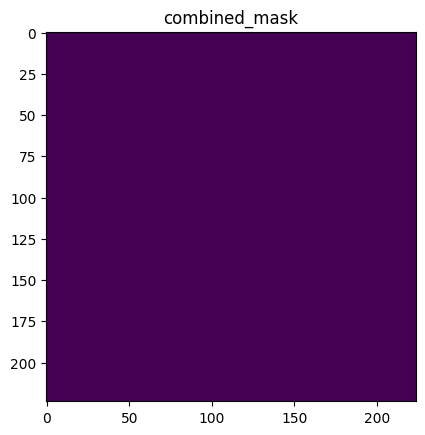

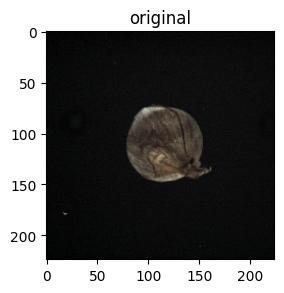

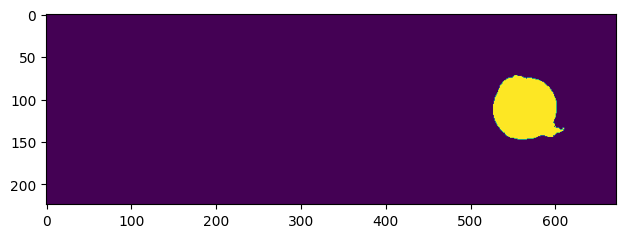

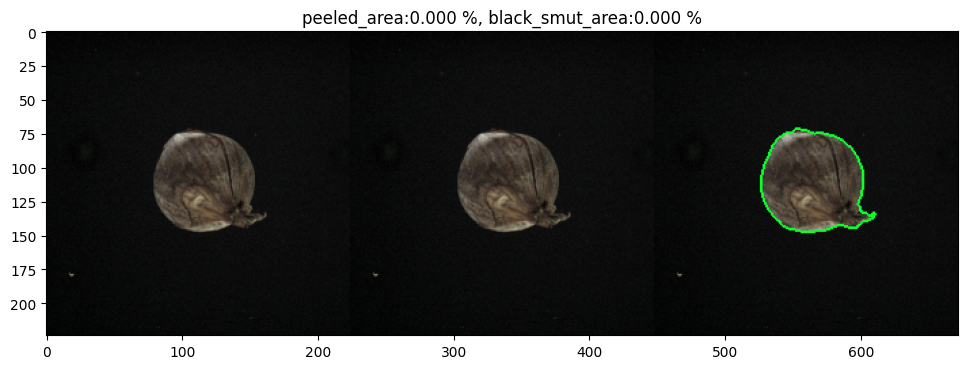

name of the image 130423_10_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.037320852279663086 sec


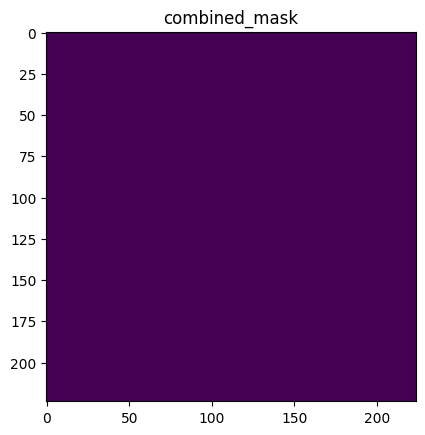

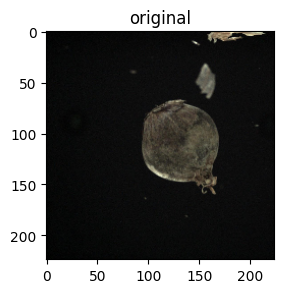

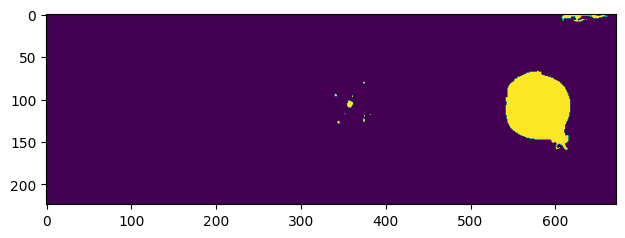

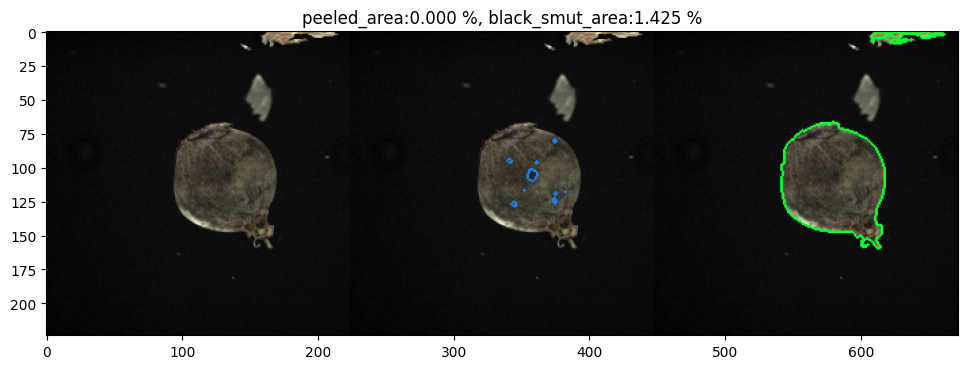

name of the image 130423_47_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.040656328201293945 sec


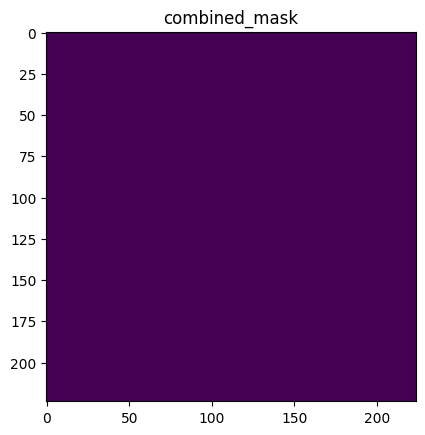

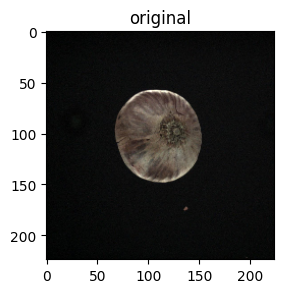

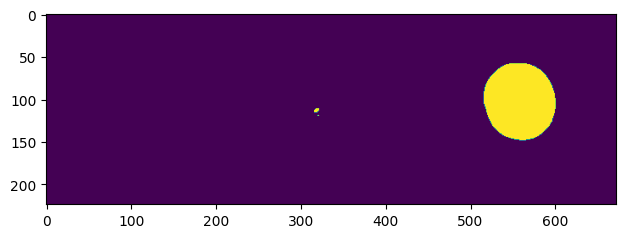

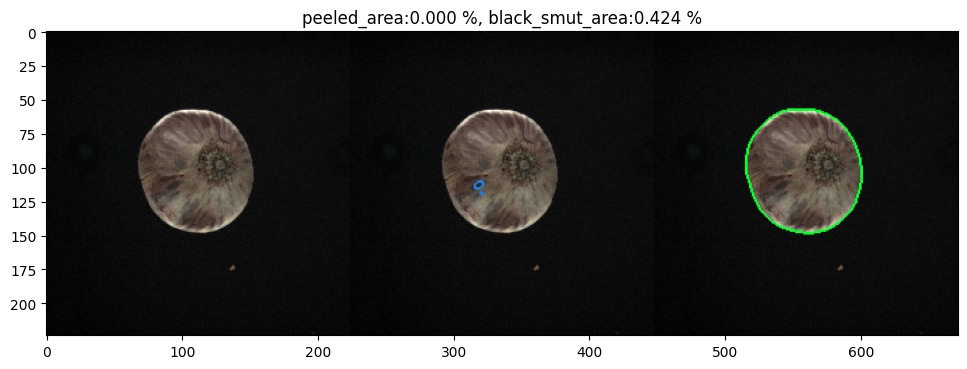

name of the image 130523_356_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.0390012264251709 sec


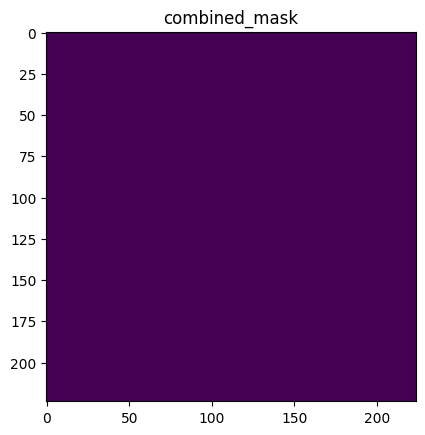

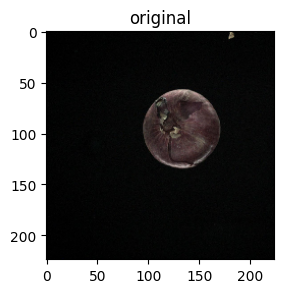

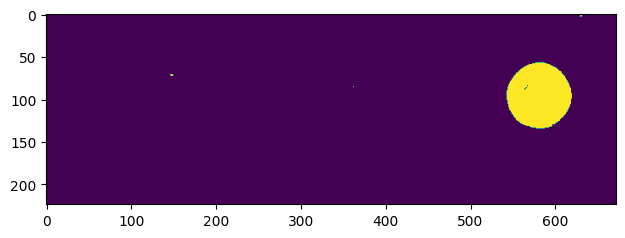

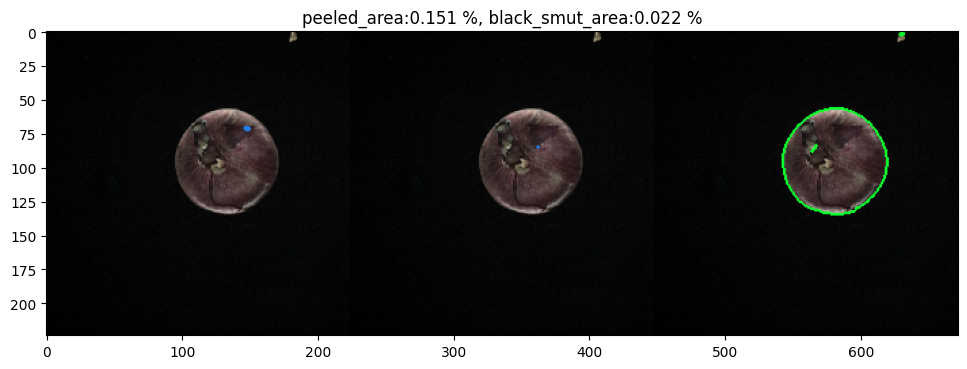

name of the image 130523_327_1.jpg
1/1 [==============================] - 0s 19ms/step
main pred hoon: 3
Time taken for pred is :  0.041127920150756836 sec


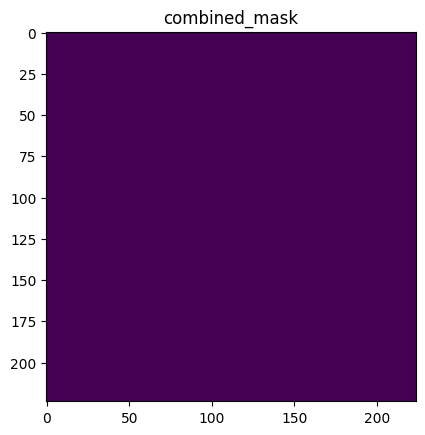

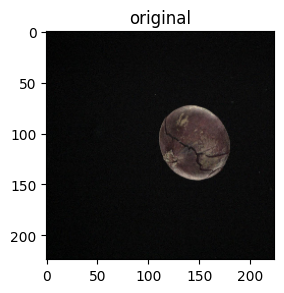

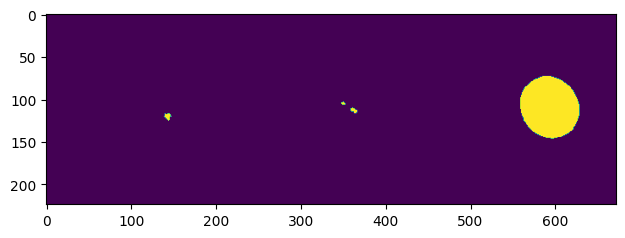

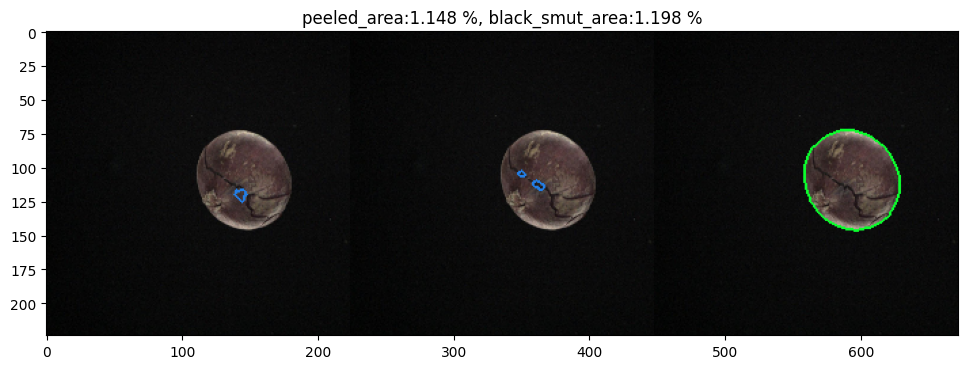

name of the image 130423_98_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03934502601623535 sec


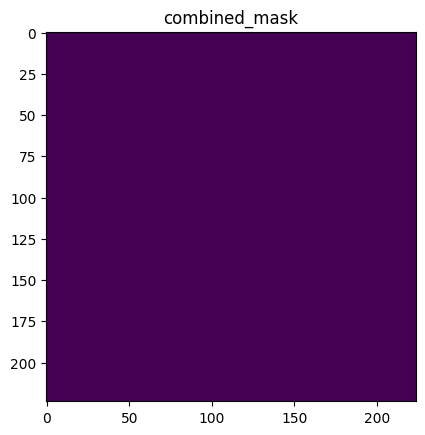

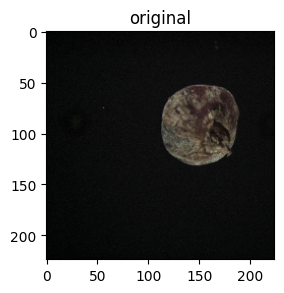

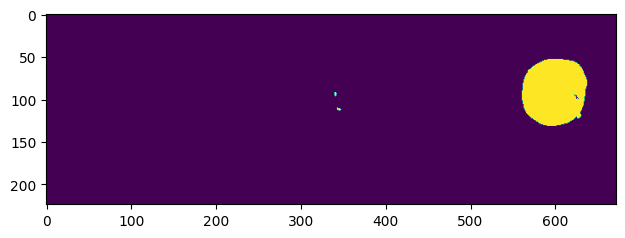

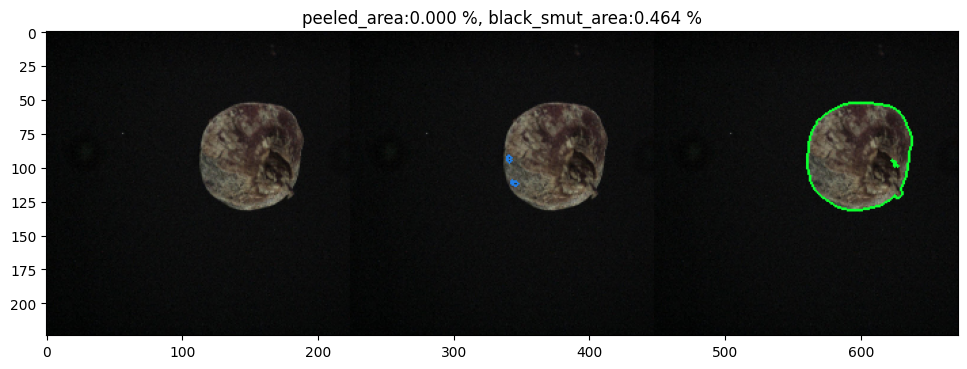

name of the image 140423_178_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03793740272521973 sec


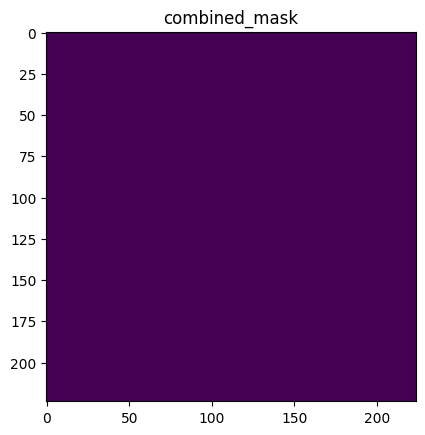

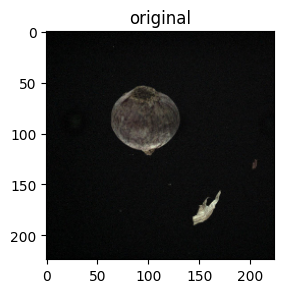

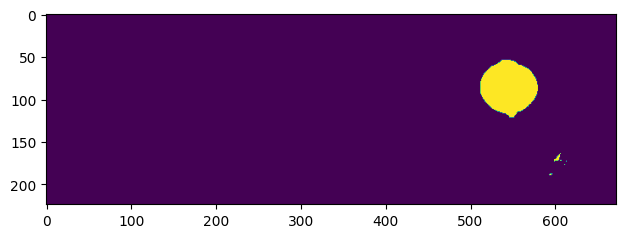

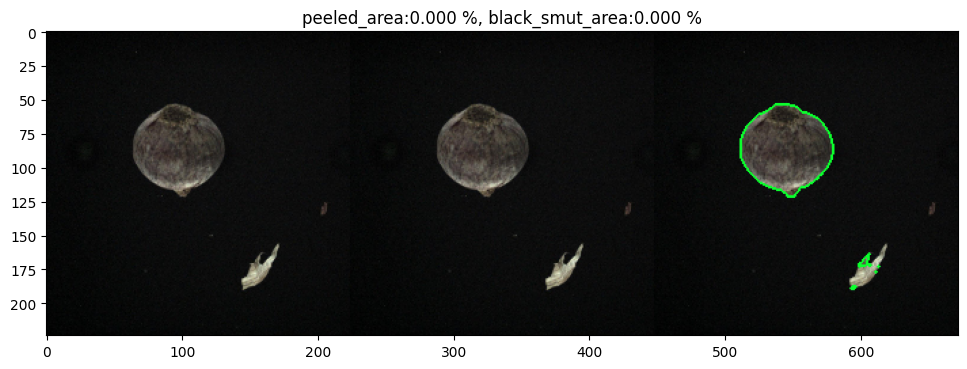

name of the image 130423_48_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.04581475257873535 sec


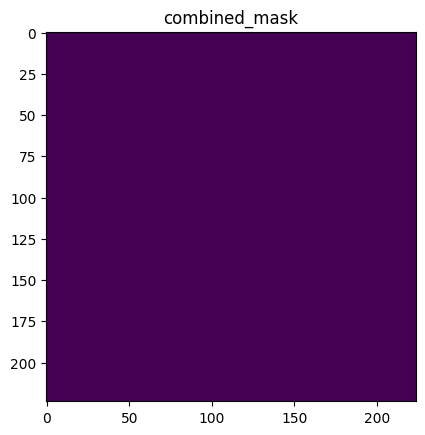

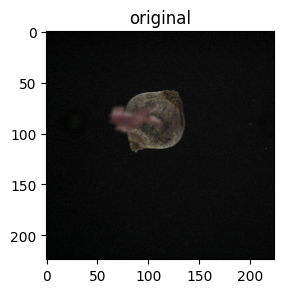

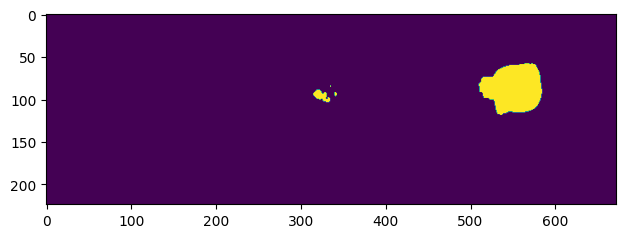

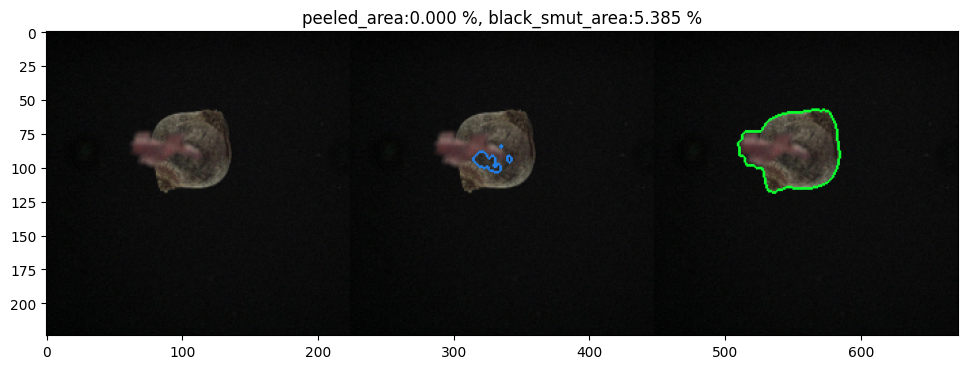

name of the image 130423_51_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.047643423080444336 sec


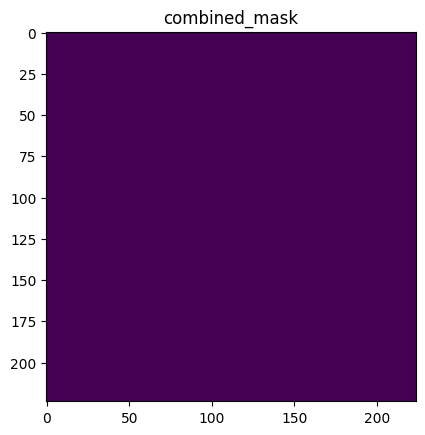

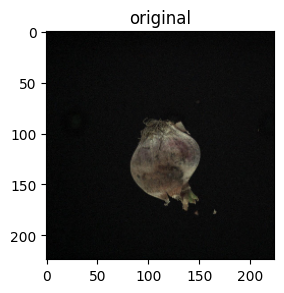

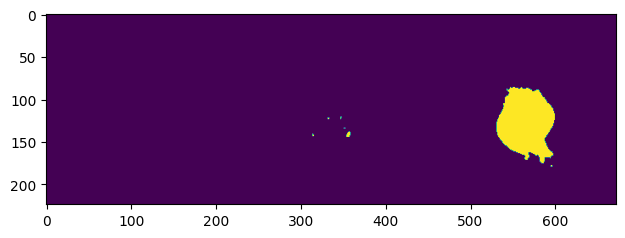

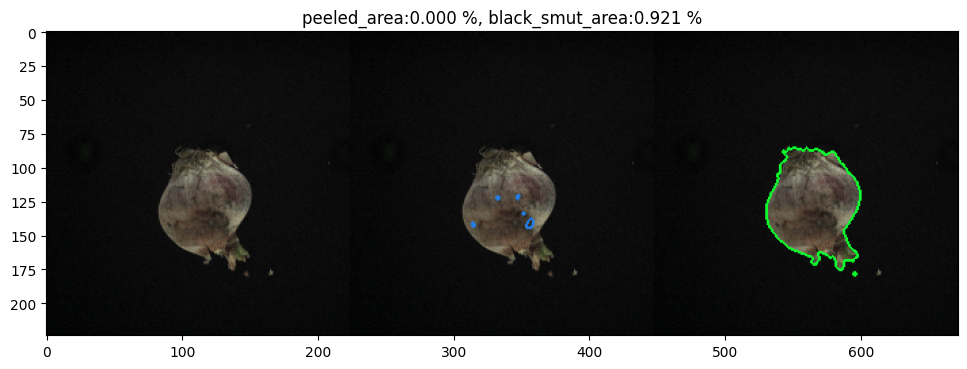

name of the image 130423_103_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.04174351692199707 sec


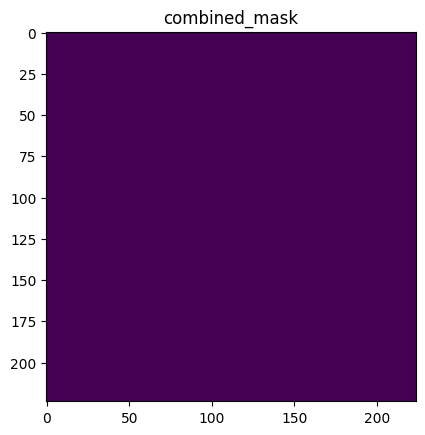

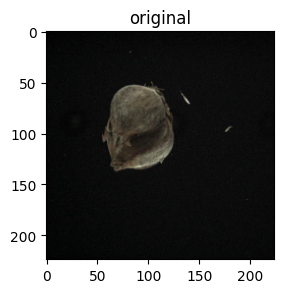

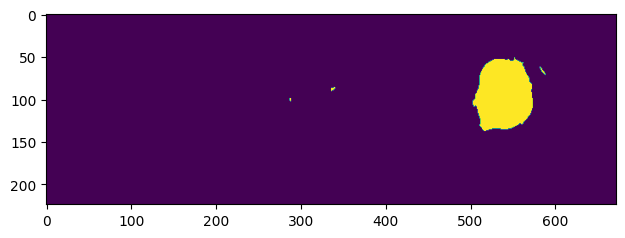

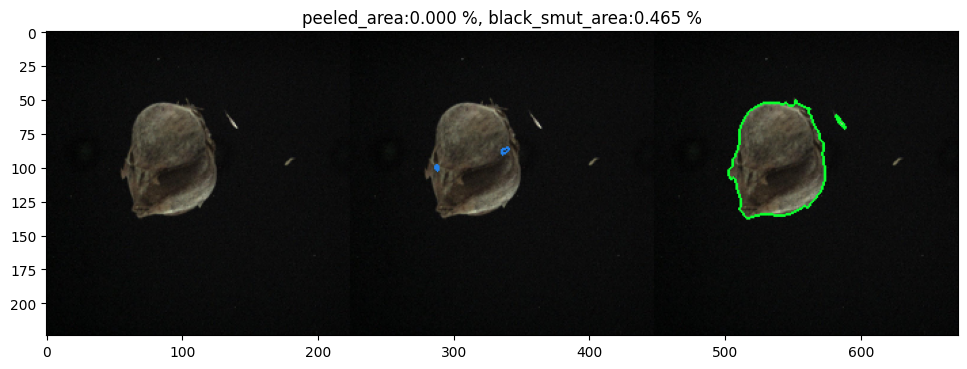

name of the image 140423_216_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.0399470329284668 sec


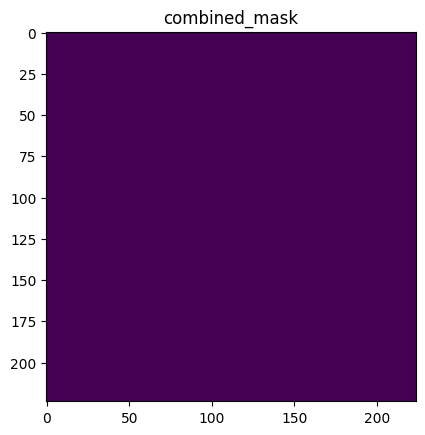

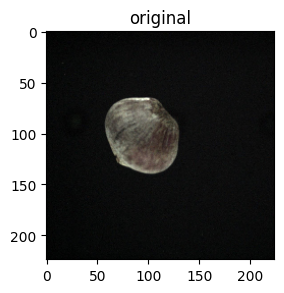

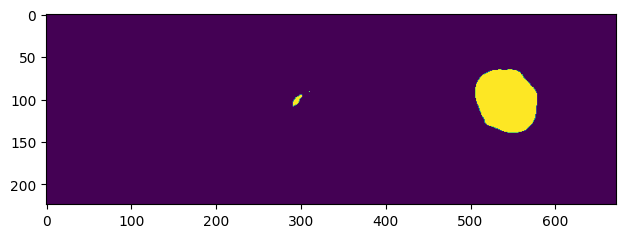

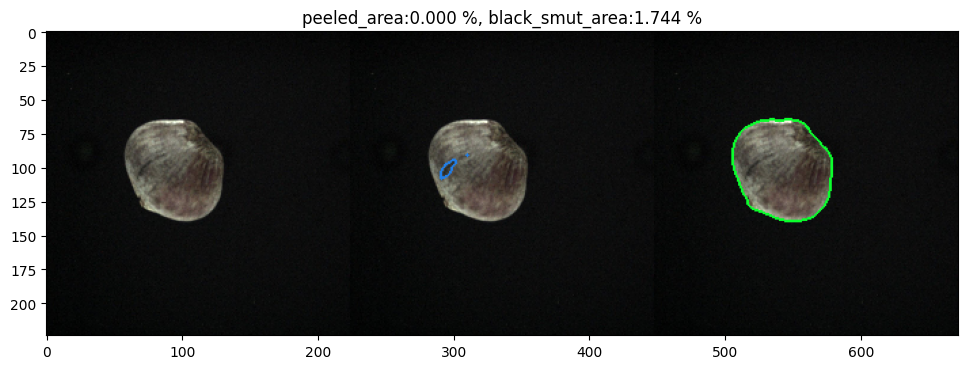

name of the image 130423_66_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03866291046142578 sec


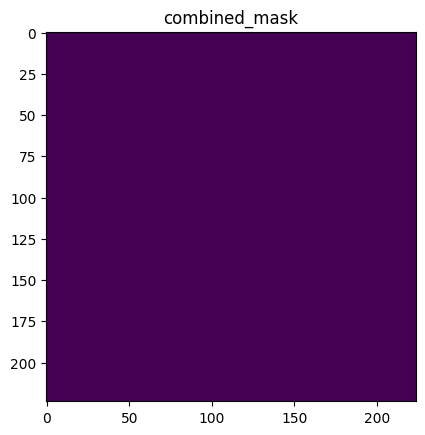

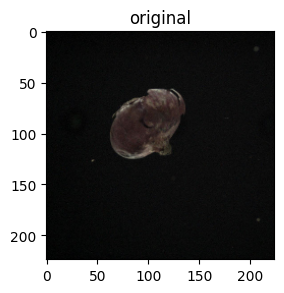

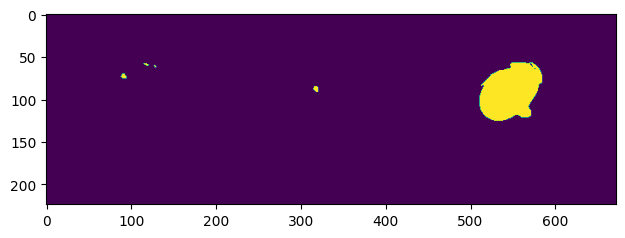

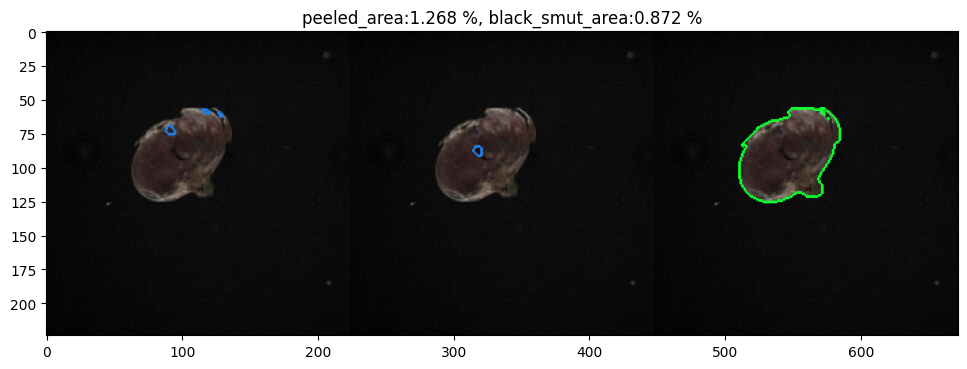

name of the image 130423_18_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03839755058288574 sec


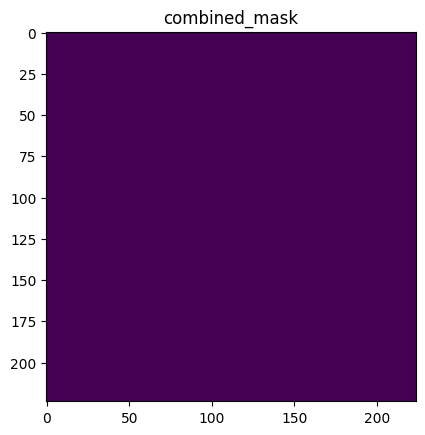

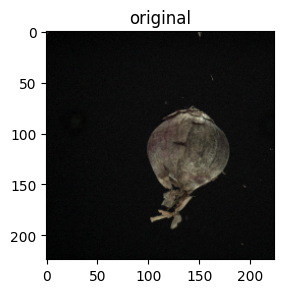

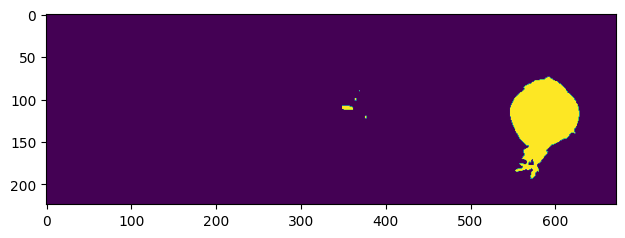

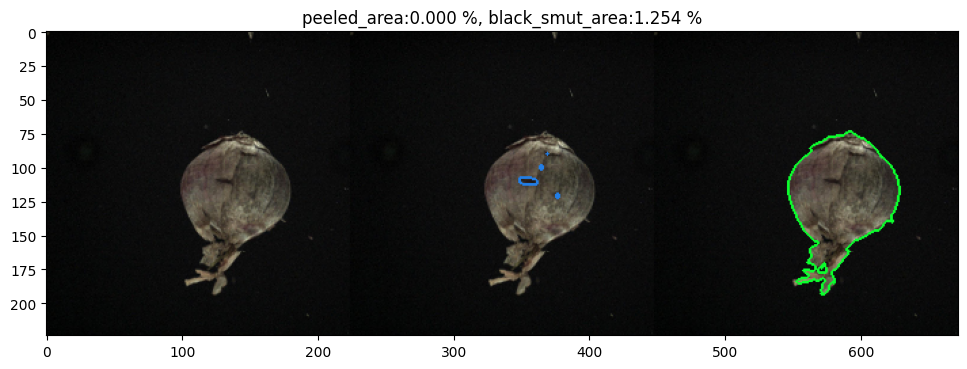

name of the image 130423_120_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.0377655029296875 sec


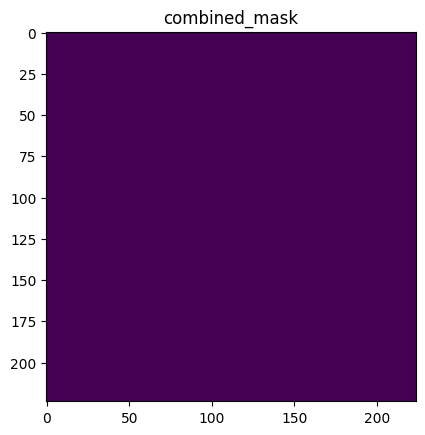

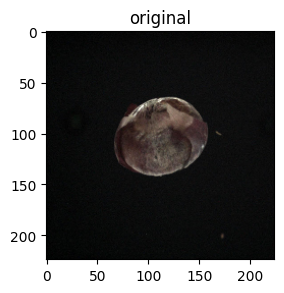

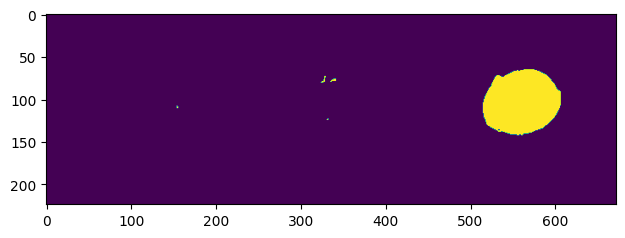

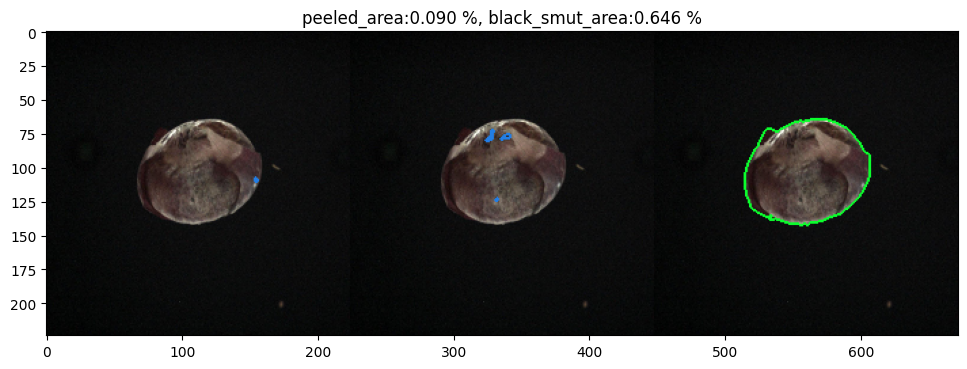

name of the image 130523_328_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.0377810001373291 sec


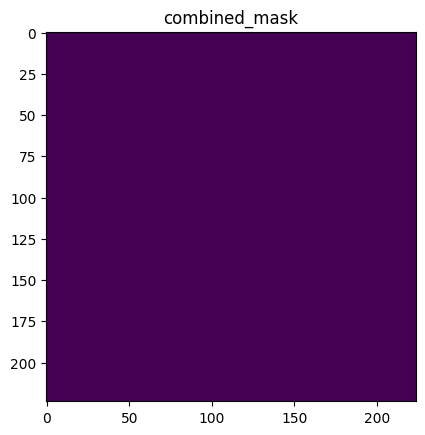

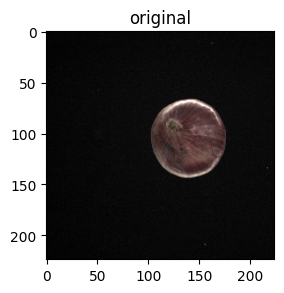

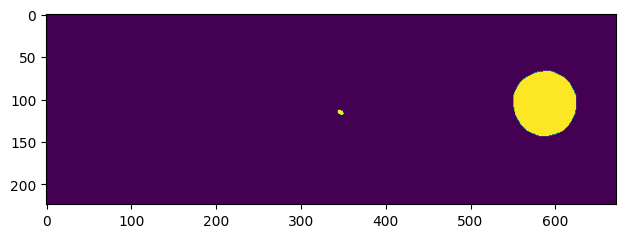

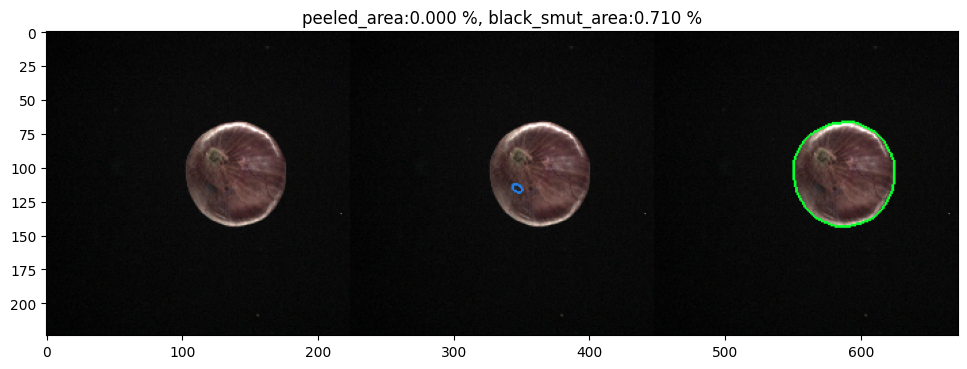

name of the image 130523_288_1.jpg
1/1 [==============================] - 0s 16ms/step
main pred hoon: 3
Time taken for pred is :  0.03819012641906738 sec


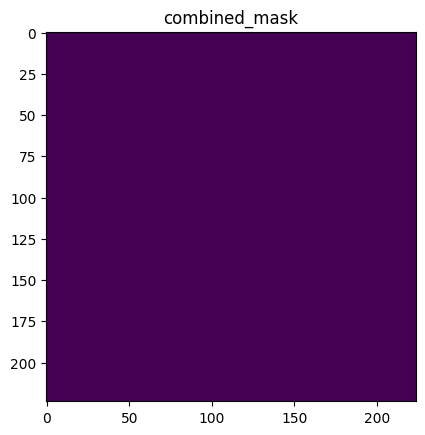

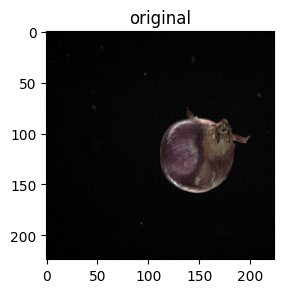

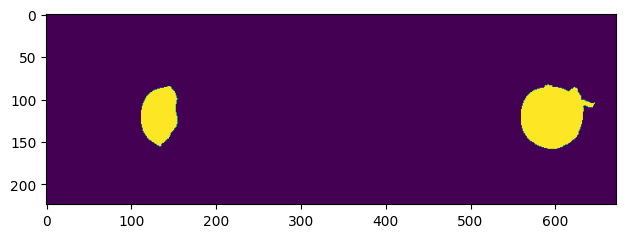

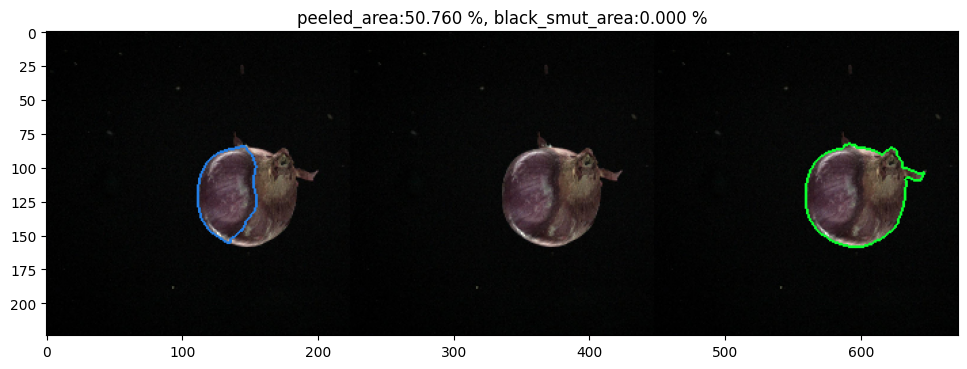

name of the image 130523_287_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.03799629211425781 sec


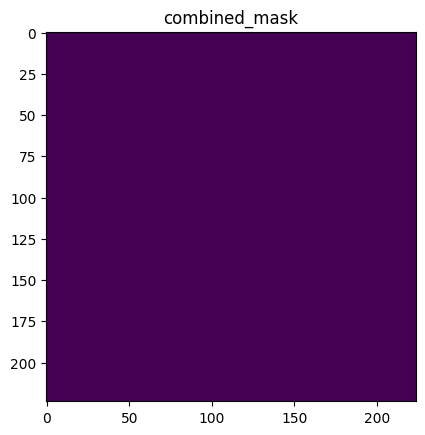

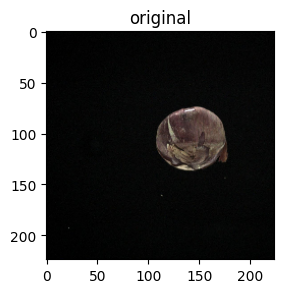

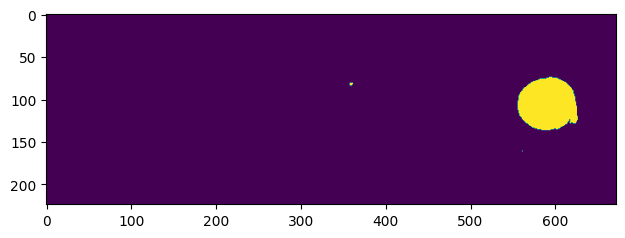

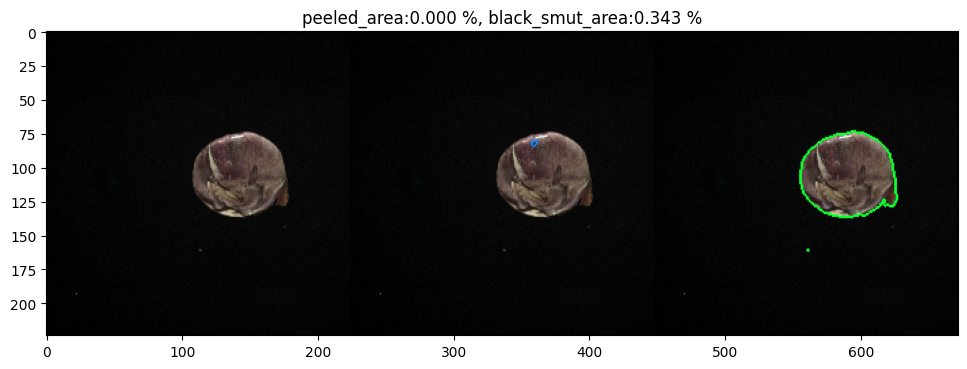

name of the image 130423_38_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.04058408737182617 sec


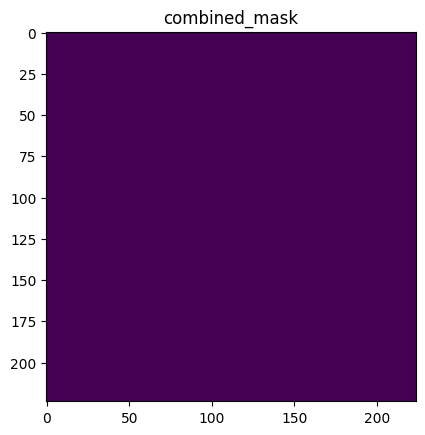

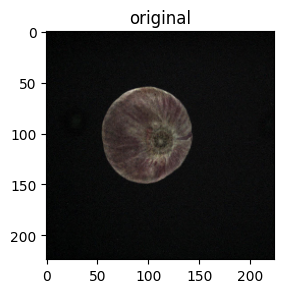

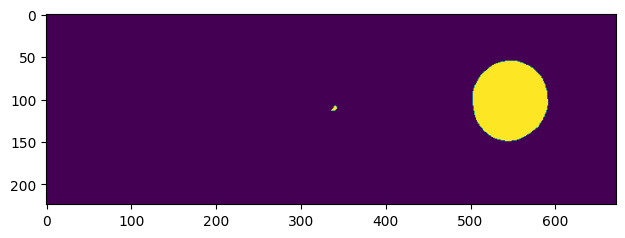

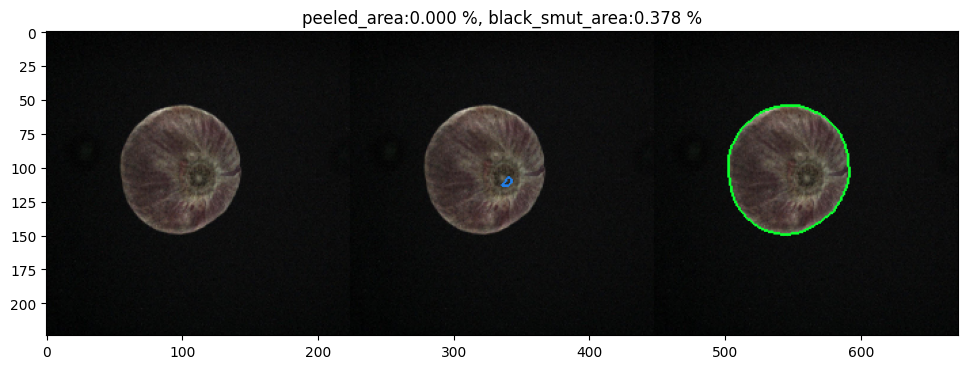

name of the image 140423_225_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.034607648849487305 sec


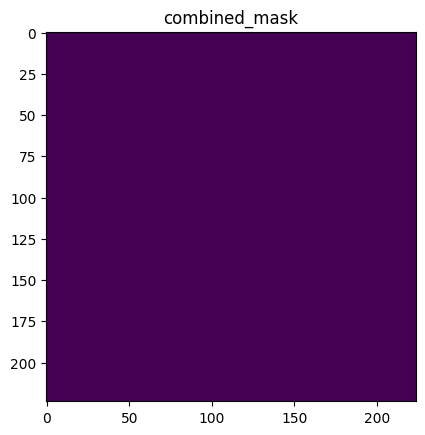

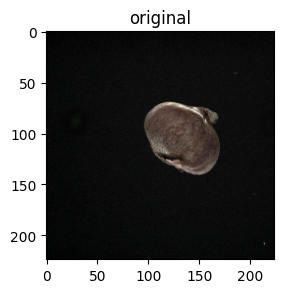

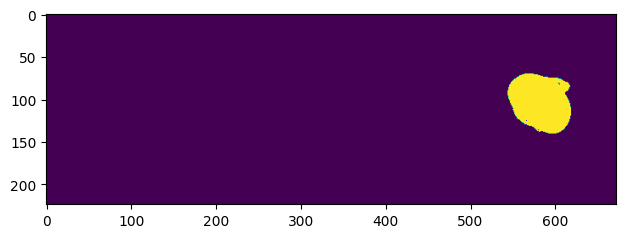

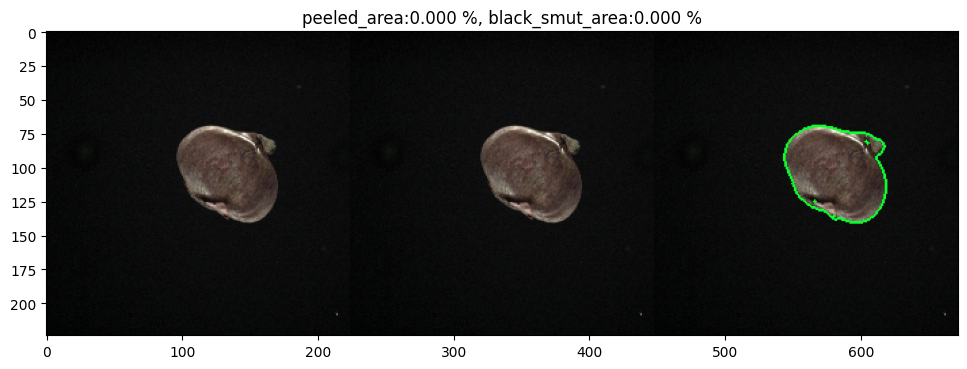

name of the image 140423_201_1.jpg
1/1 [==============================] - 0s 15ms/step
main pred hoon: 3
Time taken for pred is :  0.04119229316711426 sec


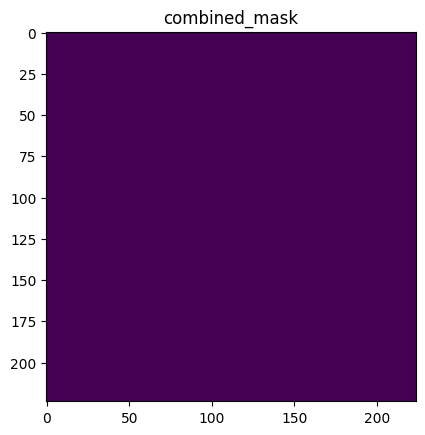

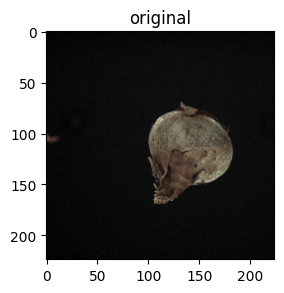

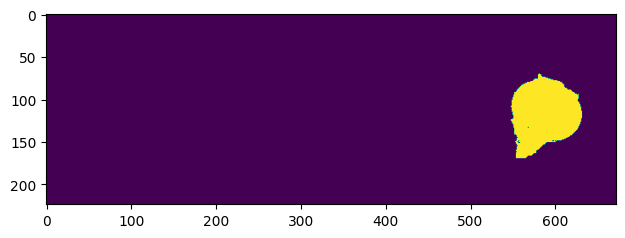

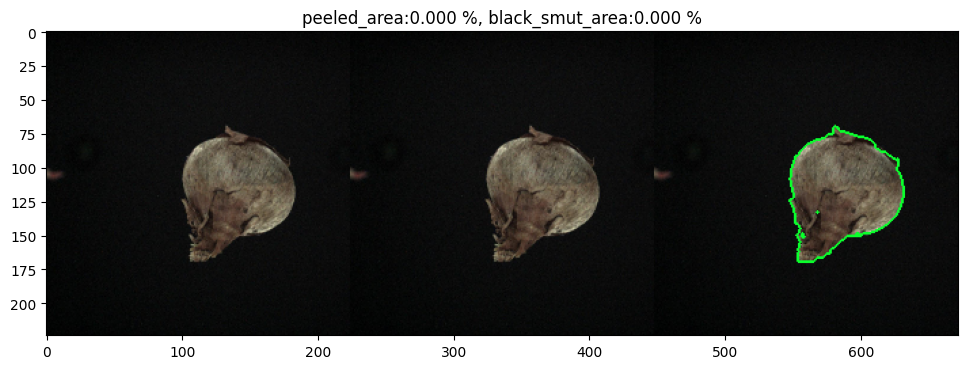

name of the image 130423_84_1.jpg
1/1 [==============================] - 0s 18ms/step
main pred hoon: 3
Time taken for pred is :  0.03760337829589844 sec


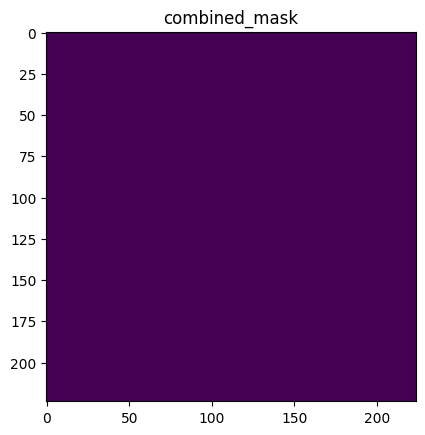

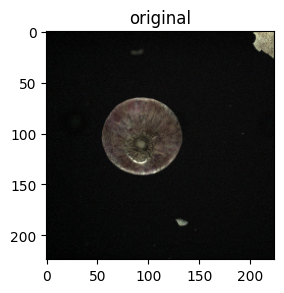

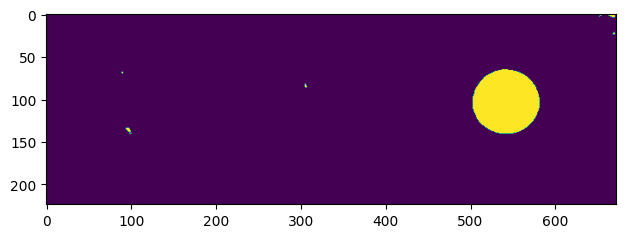

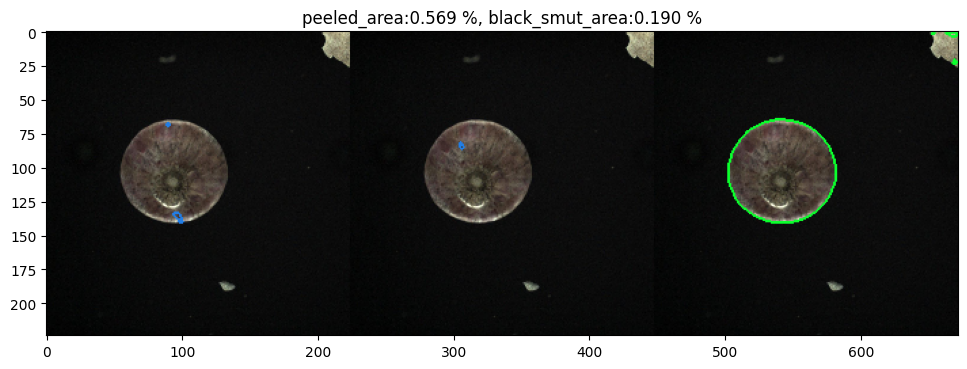

name of the image 130423_132_1.jpg
1/1 [==============================] - 0s 17ms/step
main pred hoon: 3
Time taken for pred is :  0.04302334785461426 sec


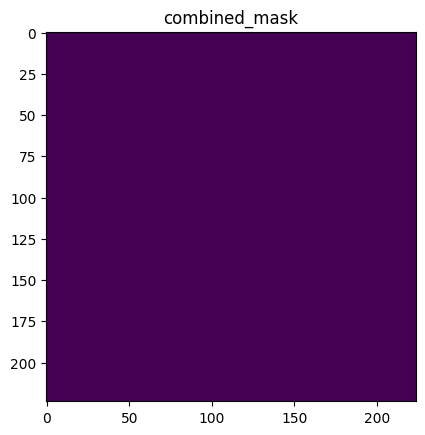

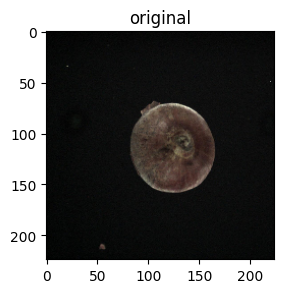

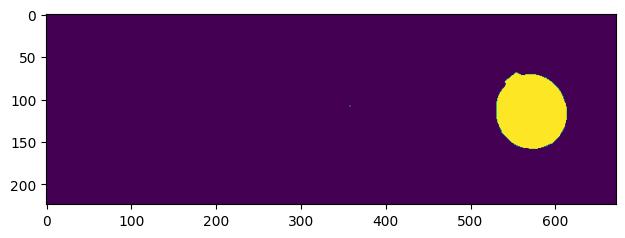

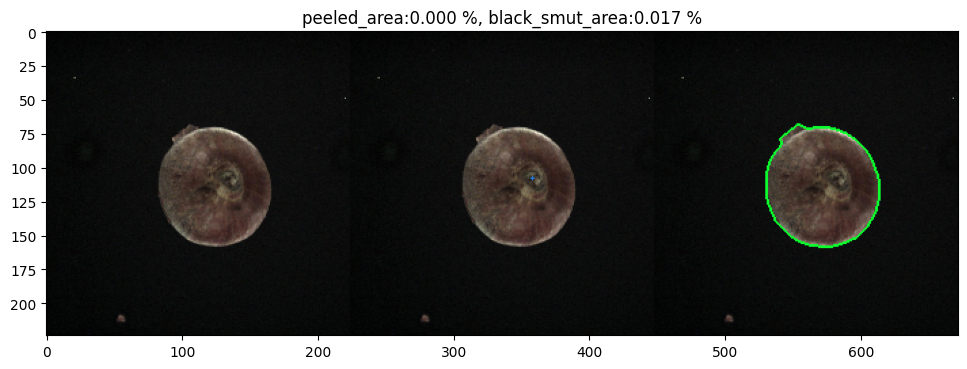

[3.5761883607285654, 1.074923792716188, 9.429514380009431, 0.0, 0.0, 0.423872499152255, 0.2246559955068801, 2.409177820267687, 0.0, 13.978692138133724, 0.17510347023241007, 2.1910112359550564, 0.11498028909329829, 0.0, 0.0, 2.1470991320237545, 0.8367346938775511, 3.714968498805127, 0.0, 1.4253563390847712, 0.42365976861658794, 0.021621621621621623, 1.1976047904191616, 0.46370967741935476, 0.0, 5.385078219013238, 0.9212344541685858, 0.46531302876480546, 1.743519155769672, 0.8718626155878467, 1.2535310734463276, 0.6455083378160302, 0.7104795737122558, 0.0, 0.3429551300371534, 0.3776435045317221, 0.0, 0.0, 0.18963337547408346, 0.01699524133242692]
['130423_31_1.jpg', '130423_107_1.jpg', '130423_101_1.jpg', '130423_49_1.jpg', '130423_35_1.jpg', '130423_61_1.jpg', '140423_170_1.jpg', '130423_90_1.jpg', '130423_65_1.jpg', '140423_202_1.jpg', '140423_233_1.jpg', '140423_203_1.jpg', '130423_138_1.jpg', '130523_353_1.jpg', '130523_282_1.jpg', '130423_44_1.jpg', '130423_74_1.jpg', '140423_227_1.

In [15]:
img_path=r'/home/agrograde/Desktop/12th_june/old_summer_onion/test/test_images/black_smut'
getPrediction(img_path)

In [41]:
pl_img1 = ['PH32169_.jpg', 'PL42144_.jpg', 'PH12156_.jpg', 'PH52179_.jpg', 'PL22130_.jpg', 'PL51153_.jpg', 'PL32140_.jpg', 'PH11157_.jpg', 'PL31138_.jpg', 'PH21161_.jpg', 'PH41173_.jpg', 'PH41172_.jpg', 'PL12128_.jpg', 'PH52181_.jpg', 'PL21131_(1).jpg', 'PH41177_.jpg', 'PH51182_.jpg', 'PL42145_.jpg', 'PH51182_(1).jpg', 'PH11159_.jpg', 'PH42176_.jpg', 'PH11160_.jpg', 'PL31142_.jpg', 'PL31138_(1).jpg', 'PL51148_.jpg', 'PL31141_.jpg', 'PL21130_.jpg', 'PH32171_.jpg', 'PL41145_.jpg', 'PL22134_.jpg', 'PL11125_.jpg', 'PL32142_.jpg', 'PH21164_.jpg', 'PL12126_.jpg', 'PH22163_.jpg', 'PH32170_.jpg', 'PL12127_.jpg', 'PH51179_.jpg', 'PH21163_.jpg', 'PH11156_.jpg', 'PH22164_.jpg', 'PL21136_.jpg', 'PH51181_.jpg', 'PL51154_.jpg', 'PL11126_.jpg', 'PH12157_.jpg', 'PH31167_.jpg', 'PH12160_.jpg', 'PL42143_.jpg', 'PL52151_.jpg', 'PL51149_.jpg', 'PL22136_.jpg', 'PH22161_.jpg', 'PH21163_(1).jpg', 'PL32141_.jpg', 'PL22133_.jpg', 'PH42177_(1).jpg', 'PH32168_.jpg', 'PH42173_.jpg', 'PL52153_.jpg', 'PL21133_.jpg', 'PL41146_.jpg', 'PL42147_(1).jpg', 'PH22166_.jpg', 'PH21166_.jpg', 'PL51151_.jpg', 'PH51178_.jpg', 'PL21131_.jpg', 'PH31171_.jpg', 'PL41145_(1).jpg', 'PL41147_.jpg', 'PH42174_.jpg', 'PH11158_.jpg', 'PH41174_.jpg', 'PH32167_.jpg', 'PL21134_.jpg', 'PL52154_.jpg', 'PH12159_.jpg', 'PH52182_.jpg', 'PH51180_.jpg', 'PL42147_.jpg', 'PL12125_.jpg', 'PL42146_.jpg', 'PL11129_.jpg', 'PL22136_(1).jpg', 'PH31169_.jpg', 'PH52178_.jpg', 'PH52180_.jpg', 'PL52148_.jpg', 'PL41146_(1).jpg', 'PH12158_.jpg', 'PL31137_.jpg', 'PH31168_.jpg', 'PL31140_.jpg', 'PH42177_.jpg', 'PL11127_.jpg', 'PH22165_.jpg', 'PL41143_.jpg', 'PH31167_(1).jpg', 'PL41144_.jpg', 'PL32137_.jpg', 'PH31170_.jpg', 'PH42172_.jpg', 'PL12129_.jpg', 'PL11128_.jpg', 'PL22131_.jpg', 'PH41176_.jpg', 'PH21165_.jpg', 'PL32138_.jpg', 'PL52149_.jpg']

In [42]:
print(len(pl_img1))

110


In [43]:
pl_lst1 = [31.42045454545454, 0.0, 88.66295264623955, 77.7398928397467, 40.40906578220011, 6.41573994867408, 0.0, 96.58545588778149, 61.968793606495, 82.304, 78.12004230565837, 81.88034188034186, 80.55708769994486, 81.66710630440518, 35.82705853777022, 74.5166521142572, 59.051856397668, 32.03580349708575, 59.051856397668, 95.1401050788091, 86.300392436675, 92.73112208892026, 76.10996563573883, 61.968793606495, 60.15088390946965, 63.37031900138696, 2.5015378306335863, 41.69861963190184, 0.0, 27.332346096890205, 41.47747747747747, 2.2911893355550923, 65.97730863133707, 66.93406868889446, 32.759336099585056, 51.87513094489839, 35.4317066127635, 59.96090568496497, 39.25156610616551, 98.27120475418694, 44.820582261340554, 46.75651392632524, 78.88165038002171, 30.28503562945368, 32.82107574094402, 94.25162689804773, 34.807382633469594, 73.8343949044586, 0.7058287795992715, 75.0329163923634, 41.99041500968697, 1.0046483730694256, 55.73102394294447, 39.25156610616551, 5.250699375941467, 58.5104308832131, 93.2656444260257, 95.36757301107754, 86.47842513422152, 66.4592094196804, 31.269349845201234, 0.0, 0.8526764566556136, 42.277121374865736, 38.13495072024261, 9.28151367936589, 59.36496610774171, 35.82705853777022, 81.73219373219374, 0.0, 0.0, 84.19724325373713, 94.13349917081261, 93.24520627542127, 82.1153484876949, 50.88888888888889, 68.77484640404771, 94.35957696827262, 81.2594458438287, 85.69640622206329, 0.8526764566556136, 68.12618982866466, 20.04875076173065, 38.50171078696201, 1.0046483730694256, 75.45073375262054, 72.31121281464532, 79.82546201232033, 19.68717100315837, 0.0, 97.52935420743638, 28.44631852092118, 61.37765077455257, 59.850534724906595, 93.2656444260257, 74.54228421970356, 70.70345408593091, 3.462930898787974, 34.807382633469594, 9.062123039806997, 9.619306594153636, 82.89328257398994, 78.06283695854249, 80.89117395029992, 16.909857328145264, 15.000934055669719, 75.10543130990416, 14.320585842148086, 0.0, 43.540134314039015]

In [44]:
print(len(pl_lst1))

110


In [45]:
result_dict = {pl_img1[index]: pl_lst1[index] for index in range(min(len(pl_img1), len(pl_lst1)))}

In [46]:
print(result_dict)

{'PH32169_.jpg': 31.42045454545454, 'PL42144_.jpg': 0.0, 'PH12156_.jpg': 88.66295264623955, 'PH52179_.jpg': 77.7398928397467, 'PL22130_.jpg': 40.40906578220011, 'PL51153_.jpg': 6.41573994867408, 'PL32140_.jpg': 0.0, 'PH11157_.jpg': 96.58545588778149, 'PL31138_.jpg': 61.968793606495, 'PH21161_.jpg': 82.304, 'PH41173_.jpg': 78.12004230565837, 'PH41172_.jpg': 81.88034188034186, 'PL12128_.jpg': 80.55708769994486, 'PH52181_.jpg': 81.66710630440518, 'PL21131_(1).jpg': 35.82705853777022, 'PH41177_.jpg': 74.5166521142572, 'PH51182_.jpg': 59.051856397668, 'PL42145_.jpg': 32.03580349708575, 'PH51182_(1).jpg': 59.051856397668, 'PH11159_.jpg': 95.1401050788091, 'PH42176_.jpg': 86.300392436675, 'PH11160_.jpg': 92.73112208892026, 'PL31142_.jpg': 76.10996563573883, 'PL31138_(1).jpg': 61.968793606495, 'PL51148_.jpg': 60.15088390946965, 'PL31141_.jpg': 63.37031900138696, 'PL21130_.jpg': 2.5015378306335863, 'PH32171_.jpg': 41.69861963190184, 'PL41145_.jpg': 0.0, 'PL22134_.jpg': 27.332346096890205, 'PL11

In [47]:
sorted_dict = dict(sorted(result_dict.items() , key = lambda item:item[1]))

In [48]:
sorted_dict

{'PL42144_.jpg': 0.0,
 'PL32140_.jpg': 0.0,
 'PL41145_.jpg': 0.0,
 'PL41146_.jpg': 0.0,
 'PL41145_(1).jpg': 0.0,
 'PL41147_.jpg': 0.0,
 'PL41146_(1).jpg': 0.0,
 'PL32138_.jpg': 0.0,
 'PL42143_.jpg': 0.7058287795992715,
 'PL42147_(1).jpg': 0.8526764566556136,
 'PL42147_.jpg': 0.8526764566556136,
 'PL22136_.jpg': 1.0046483730694256,
 'PL22136_(1).jpg': 1.0046483730694256,
 'PL32142_.jpg': 2.2911893355550923,
 'PL21130_.jpg': 2.5015378306335863,
 'PL41143_.jpg': 3.462930898787974,
 'PL32141_.jpg': 5.250699375941467,
 'PL51153_.jpg': 6.41573994867408,
 'PL41144_.jpg': 9.062123039806997,
 'PL51151_.jpg': 9.28151367936589,
 'PL32137_.jpg': 9.619306594153636,
 'PH21165_.jpg': 14.320585842148086,
 'PL22131_.jpg': 15.000934055669719,
 'PL11128_.jpg': 16.909857328145264,
 'PL52148_.jpg': 19.68717100315837,
 'PL42146_.jpg': 20.04875076173065,
 'PL22134_.jpg': 27.332346096890205,
 'PL31137_.jpg': 28.44631852092118,
 'PL51154_.jpg': 30.28503562945368,
 'PL21133_.jpg': 31.269349845201234,
 'PH32169_

## Sprouts

In [ ]:
img_path=r'/home/ti/Desktop/5th_jan/test1/Sprouts'
getPrediction(img_path)

### Rotten

In [ ]:
img_path=r'/home/ti/Desktop/5th_jan/test1/Sprouts'
getPrediction(img_path)

### Rotten

In [ ]:
img_path=r'/home/ti/Desktop/5th_jan/test1/Rotten'
getPrediction(img_path)